In [4]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install imblearn

Note: you may need to restart the kernel to use updated packages.


In [6]:
pip install scikit-optimize

Note: you may need to restart the kernel to use updated packages.


## Introduction

In this project you will predict fraudulent credit card transactions with the help of Machine learning models. In this project, we will analyse customer-level data that has been collected and analysed during a research collaboration of Worldline and the Machine Learning Group.For many banks, retaining high profitable customers is the number one business goal. Banking fraud, however, poses a significant threat to this goal for different banks. In terms of substantial financial losses, trust and credibility, this is a concerning issue to both banks and customers alike.


## Table Of Contents

## Import Libraries

In [7]:
import numpy as np
import pandas as pd
import time
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from scipy import stats
from scipy.stats import norm, skew
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax
import sklearn
from sklearn import metrics
from sklearn.metrics import roc_curve, auc 
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.metrics import average_precision_score, precision_recall_curve
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler, PowerTransformer, PolynomialFeatures
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold, StratifiedKFold, StratifiedShuffleSplit, RepeatedKFold 
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import Ridge, Lasso, LogisticRegression
from sklearn.linear_model import LogisticRegressionCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostClassifier
import xgboost as xgb
from xgboost import XGBClassifier
from xgboost import plot_importance
from xgboost.sklearn import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.metrics import roc_auc_score, auc, roc_curve, accuracy_score, recall_score
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler, SMOTE, ADASYN
from skopt import BayesSearchCV
import warnings
warnings.filterwarnings("ignore")

In [8]:
pip list

Package                       Version
----------------------------- --------------------
absl-py                       1.4.0
alabaster                     0.7.12
altair                        5.1.2
anaconda-anon-usage           0.4.3
anaconda-client               1.11.0
anaconda-cloud-auth           0.1.4
anaconda-navigator            2.5.1
anaconda-project              0.11.1
anyio                         3.5.0
appdirs                       1.4.4
argon2-cffi                   21.3.0
argon2-cffi-bindings          21.2.0
arrow                         1.2.2
astroid                       2.11.7
astropy                       5.1
async-lru                     2.0.4
atomicwrites                  1.4.0
attrs                         23.1.0
Automat                       20.2.0
autopep8                      1.6.0
Babel                         2.11.0
backcall                      0.2.0
backports.functools-lru-cache 1.6.4
backports.tempfile            1.0
backports.weakref             1.0.post1
bc

### Read File

In [9]:
df=pd.read_csv("creditcard.csv")
df

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.77,0
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.79,0
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.88,0
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.00,0


In [10]:
df.head(10)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
5,2.0,-0.425966,0.960523,1.141109,-0.168252,0.420987,-0.029728,0.476201,0.260314,-0.568671,...,-0.208254,-0.559825,-0.026398,-0.371427,-0.232794,0.105915,0.253844,0.081080,3.67,0
6,4.0,1.229658,0.141004,0.045371,1.202613,0.191881,0.272708,-0.005159,0.081213,0.464960,...,-0.167716,-0.270710,-0.154104,-0.780055,0.750137,-0.257237,0.034507,0.005168,4.99,0
7,7.0,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,40.80,0
8,7.0,-0.894286,0.286157,-0.113192,-0.271526,2.669599,3.721818,0.370145,0.851084,-0.392048,...,-0.073425,-0.268092,-0.204233,1.011592,0.373205,-0.384157,0.011747,0.142404,93.20,0
9,9.0,-0.338262,1.119593,1.044367,-0.222187,0.499361,-0.246761,0.651583,0.069539,-0.736727,...,-0.246914,-0.633753,-0.120794,-0.385050,-0.069733,0.094199,0.246219,0.083076,3.68,0


## Summarize Dataset

In [11]:
df.tail(10)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
284797,172782.0,-0.241923,0.712247,0.399806,-0.463406,0.244531,-1.343668,0.929369,-0.206210,0.106234,...,-0.228876,-0.514376,0.279598,0.371441,-0.559238,0.113144,0.131507,0.081265,5.49,0
284798,172782.0,0.219529,0.881246,-0.635891,0.960928,-0.152971,-1.014307,0.427126,0.121340,-0.285670,...,0.099936,0.337120,0.251791,0.057688,-1.508368,0.144023,0.181205,0.215243,24.05,0
284799,172783.0,-1.775135,-0.004235,1.189786,0.331096,1.196063,5.519980,-1.518185,2.080825,1.159498,...,0.103302,0.654850,-0.348929,0.745323,0.704545,-0.127579,0.454379,0.130308,79.99,0
284800,172784.0,2.039560,-0.175233,-1.196825,0.234580,-0.008713,-0.726571,0.017050,-0.118228,0.435402,...,-0.268048,-0.717211,0.297930,-0.359769,-0.315610,0.201114,-0.080826,-0.075071,2.68,0
284801,172785.0,0.120316,0.931005,-0.546012,-0.745097,1.130314,-0.235973,0.812722,0.115093,-0.204064,...,-0.314205,-0.808520,0.050343,0.102800,-0.435870,0.124079,0.217940,0.068803,2.69,0
284802,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.77,0
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.79,0
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.88,0
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.00,0
284806,172792.0,-0.533413,-0.189733,0.703337,-0.506271,-0.012546,-0.649617,1.577006,-0.414650,0.486180,...,0.261057,0.643078,0.376777,0.008797,-0.473649,-0.818267,-0.002415,0.013649,217.00,0


In [12]:
print("Data dimension:",df.shape)
print("Data size:",df.size)
print("Number of Row:",len(df.index))
print("Number of Columns:",len(df.columns))

Data dimension: (284807, 31)
Data size: 8829017
Number of Row: 284807
Number of Columns: 31


In [13]:
df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

In [14]:
df.dtypes

Time      float64
V1        float64
V2        float64
V3        float64
V4        float64
V5        float64
V6        float64
V7        float64
V8        float64
V9        float64
V10       float64
V11       float64
V12       float64
V13       float64
V14       float64
V15       float64
V16       float64
V17       float64
V18       float64
V19       float64
V20       float64
V21       float64
V22       float64
V23       float64
V24       float64
V25       float64
V26       float64
V27       float64
V28       float64
Amount    float64
Class       int64
dtype: object

In [15]:
df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,3.918649e-15,5.682686e-16,-8.761736e-15,2.811118e-15,-1.552103e-15,2.040130e-15,-1.698953e-15,-1.893285e-16,-3.147640e-15,...,1.473120e-16,8.042109e-16,5.282512e-16,4.456271e-15,1.426896e-15,1.701640e-15,-3.662252e-16,-1.217809e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


## Null Values Analyse

In [16]:
df.isnull().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

## Exploratory Data Analysis

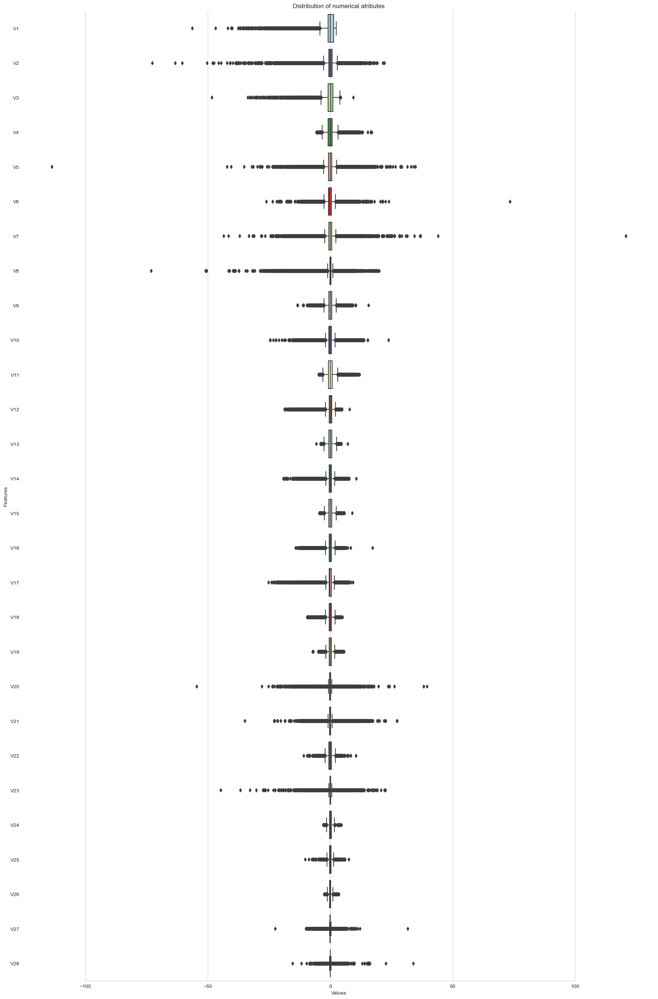

In [17]:
# Boxplot to understand the distribution of numerical attributes :

# Selecting only numerical feature from the dataframe:
numeric_features = df.select_dtypes(include=[np.number]).columns.tolist()

# Excluding BINARY target feature(Class) and Time variable as its not needed for transformation and Amount variable as its covered in previous plot: 
li_not_plot = ['Class', 'Time', 'Amount']
li_transform_num_feats = [c for c in list(numeric_features) if c not in li_not_plot]

sns.set_style("whitegrid")
f, ax = plt.subplots(figsize=(22,34))
# Using log scale:
#ax.set_xscale("log")
ax = sns.boxplot(data=df[li_transform_num_feats] , orient="h", palette="Paired")
ax.set(ylabel="Features")
ax.set(xlabel="Values")
ax.set(title="Distribution of numerical atributes")
sns.despine(trim=True,left=True)

In [18]:
classes=df['Class'].value_counts()
normal_share=classes[0]/df['Class'].count()*100
fraud_share=classes[1]/df['Class'].count()*100
print(normal_share)
print(fraud_share)

99.82725143693798
0.1727485630620034


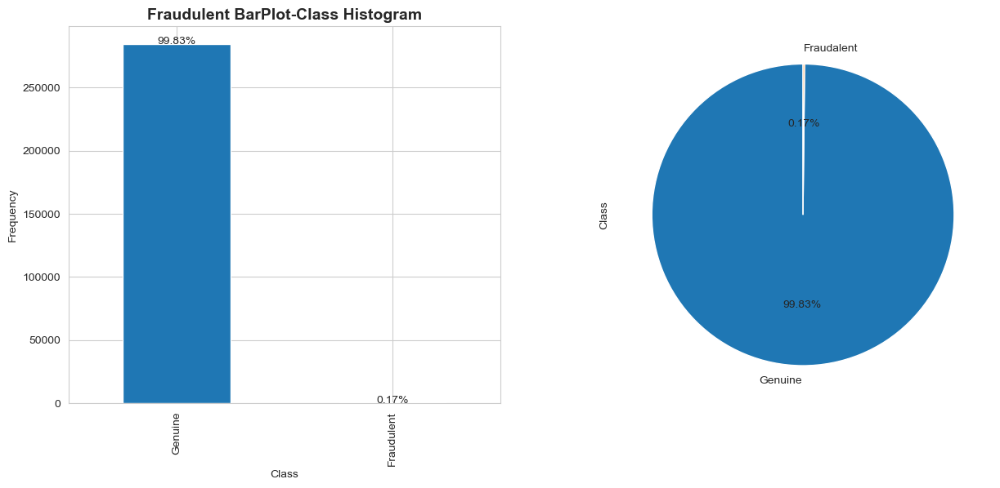

In [19]:
# Create a bar plot for the number and percentage of fraudulent vs non-fraudulent transcations
plt.figure(figsize=(15,6))
plt.subplot(121)
plt.title('Fraudulent BarPlot-Class Histogram', fontweight='bold',fontsize=14)
count_of_classes = pd.value_counts(df['Class'], sort = True).sort_index()
ax = count_of_classes.plot(kind = 'bar')
plt.xlabel("Class")
plt.ylabel("Frequency")
plt.xticks([0,1],["Genuine","Fraudulent"])
total = float(len(df))
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height*100/total),
            ha="center") 
plt.subplot(122)
labels = 'Genuine', 'Fraudalent'
df["Class"].value_counts().plot.pie(autopct = "%1.2f%%", labels=labels, startangle=90)
plt.show()

## Visualization Time Distribution

<AxesSubplot:title={'center':'Distribution of Transaction Time'}, ylabel='Density'>

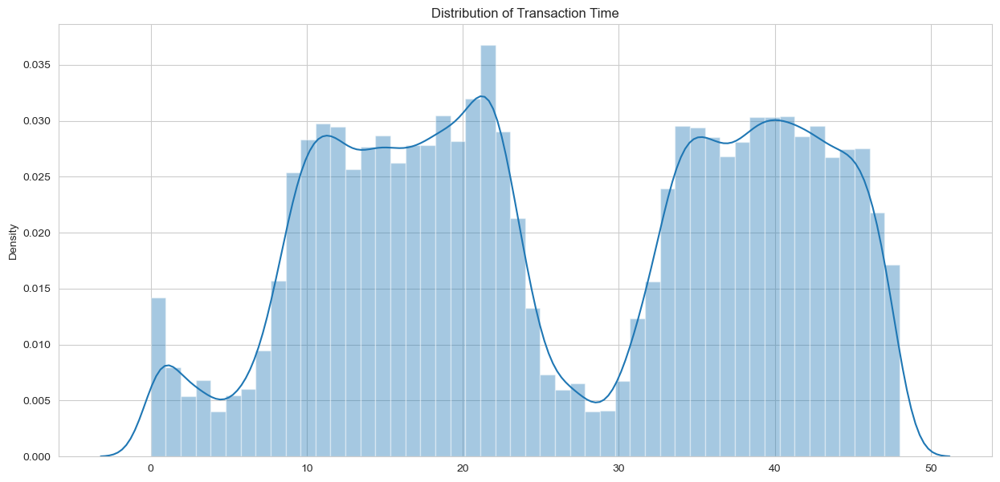

In [20]:
plt.figure(figsize=(15,7))
plt.title('Distribution of Transaction Time')
sns.distplot(df['Time'].values/(60*60))

In [21]:
Delta_Time = pd.to_timedelta(df['Time'], unit='s')
#Create derived columns Mins and hours
df['Time_Day'] = (Delta_Time.dt.components.days).astype(int)
df['Time_Hour'] = (Delta_Time.dt.components.hours).astype(int)
df['Time_Min'] = (Delta_Time.dt.components.minutes).astype(int)

Text(0.5, 1.05, 'Time vs Class Distribution')

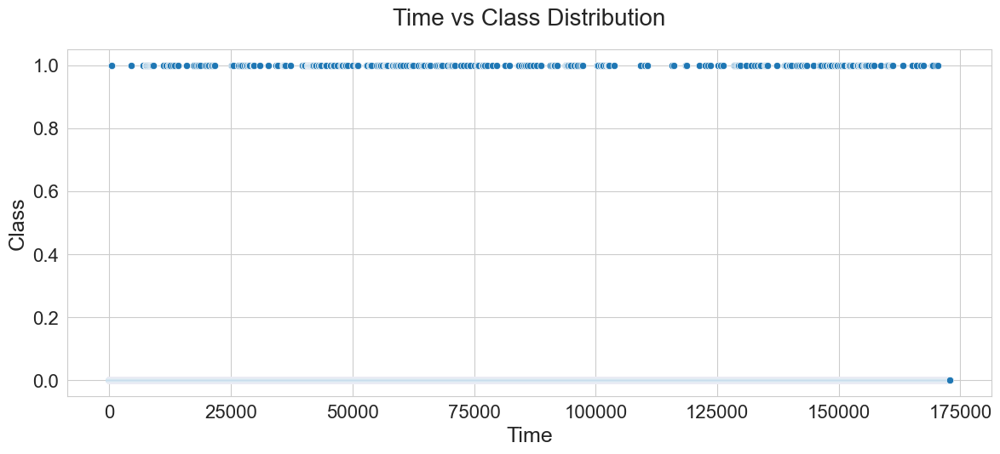

In [22]:
fig = plt.figure(figsize=(14, 18))
cmap = sns.color_palette('Set2')

# PLot the relation between the variables:

plt.subplot(3,1,1)
sns.scatterplot(x=df['Time'], y='Class', palette=cmap, data=df)
plt.xlabel('Time', size=18)
plt.ylabel('Class', size=18)
plt.tick_params(axis='x', labelsize=16)
plt.tick_params(axis='y', labelsize=16) 
plt.title('Time vs Class Distribution', size=20, y=1.05)

In [23]:
df_nonfraud = df[df.Class == 0]
df_fraud = df[df.Class == 1]

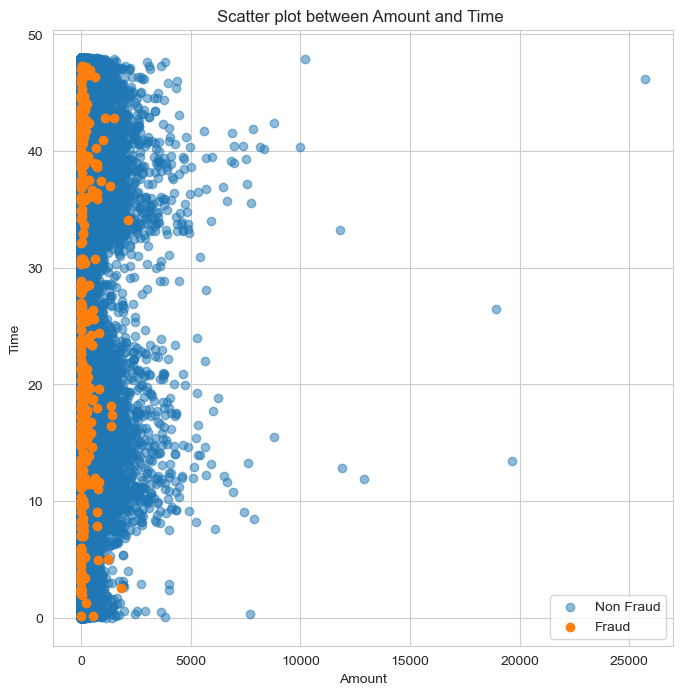

In [24]:
fig = plt.figure(figsize = (8,8))
plt.scatter(df_nonfraud.Amount, df_nonfraud.Time.values/(60*60),alpha=0.5,label='Non Fraud')
plt.scatter(df_fraud.Amount, df_fraud.Time.values/(60*60),alpha=1,label='Fraud')
plt.xlabel('Amount')
plt.ylabel('Time')
plt.title('Scatter plot between Amount and Time ')
plt.legend()
plt.show()

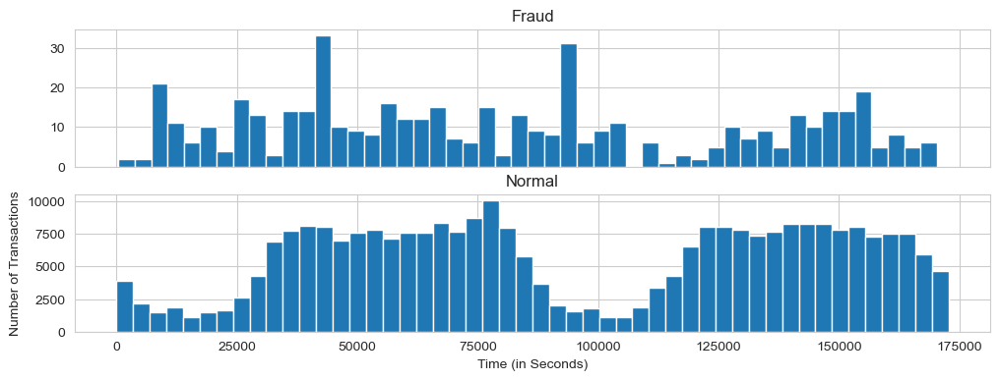

In [25]:
f, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(12,4))
bins = 50
ax1.hist(df.Time[df.Class == 1], bins = bins)
ax1.set_title('Fraud')
ax2.hist(df.Time[df.Class == 0], bins = bins)
ax2.set_title('Normal')
plt.xlabel('Time (in Seconds)')
plt.ylabel('Number of Transactions')
plt.show()

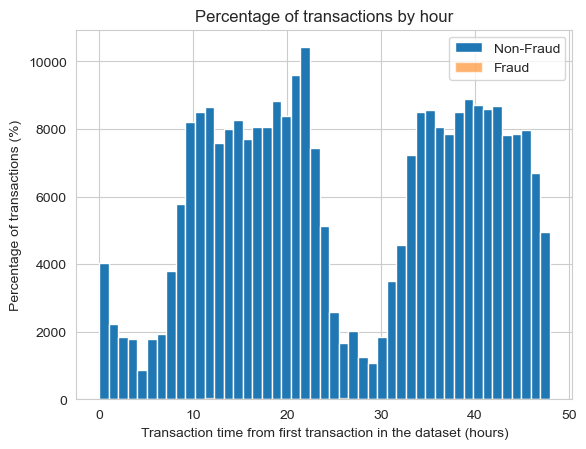

In [26]:
bins = np.linspace(0, 48, 48)
plt.hist((df_nonfraud.Time/(60*60)), bins, alpha=1,label='Non-Fraud')
plt.hist((df_fraud.Time/(60*60)), bins, alpha=0.6,label='Fraud')
plt.legend(loc='upper right')
plt.title("Percentage of transactions by hour")
plt.xlabel("Transaction time from first transaction in the dataset (hours)")
plt.ylabel("Percentage of transactions (%)")
plt.show()

## Visualization Amount Distribution

Text(0, 0.5, 'Density')

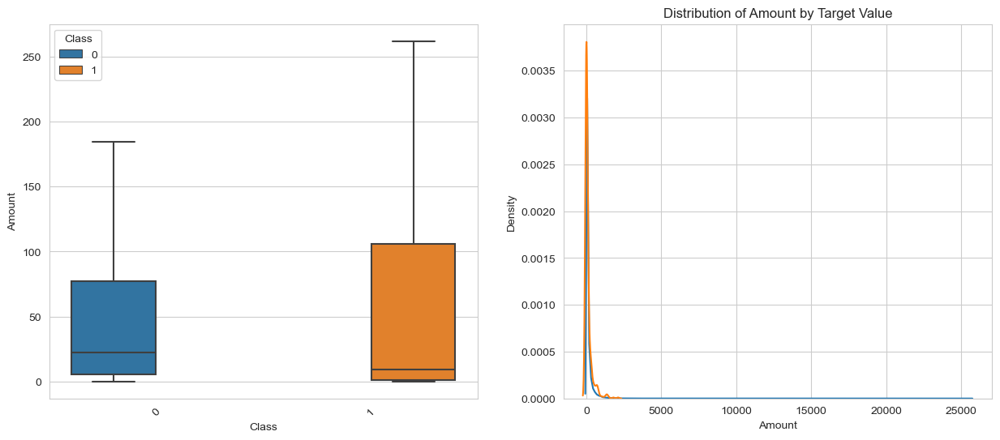

In [27]:
plt.figure(figsize = (15, 6))
plt.subplot(121)
a = sns.boxplot(x = 'Class', y = 'Amount',hue='Class', data = df, showfliers=False) 
plt.setp(a.get_xticklabels(), rotation=45)
plt.subplot(122)
# KDE plot to visualize the distribution of Amount for both the classes
plt.rcParams['figure.figsize'] = [10,6]
sns.kdeplot(df.loc[df['Class'] == 0, 'Amount'], label = 'Non Fraud')
sns.kdeplot(df.loc[df['Class'] == 1, 'Amount'], label = 'Fraud')
plt.title('Distribution of Amount by Target Value')
plt.xlabel('Amount')
plt.ylabel('Density')

In [28]:
df_Fraud = df[df['Class'] == 1]
df_Regular = df[df['Class'] == 0]
# Fraud Transaction Amount Statistics
print(df_Fraud["Amount"].describe())

count     492.000000
mean      122.211321
std       256.683288
min         0.000000
25%         1.000000
50%         9.250000
75%       105.890000
max      2125.870000
Name: Amount, dtype: float64


In [29]:
#Regular Transaction Amount Statistics
print(df_Regular["Amount"].describe())

count    284315.000000
mean         88.291022
std         250.105092
min           0.000000
25%           5.650000
50%          22.000000
75%          77.050000
max       25691.160000
Name: Amount, dtype: float64


Text(0.5, 1.05, 'Amount vs Class Distribution')

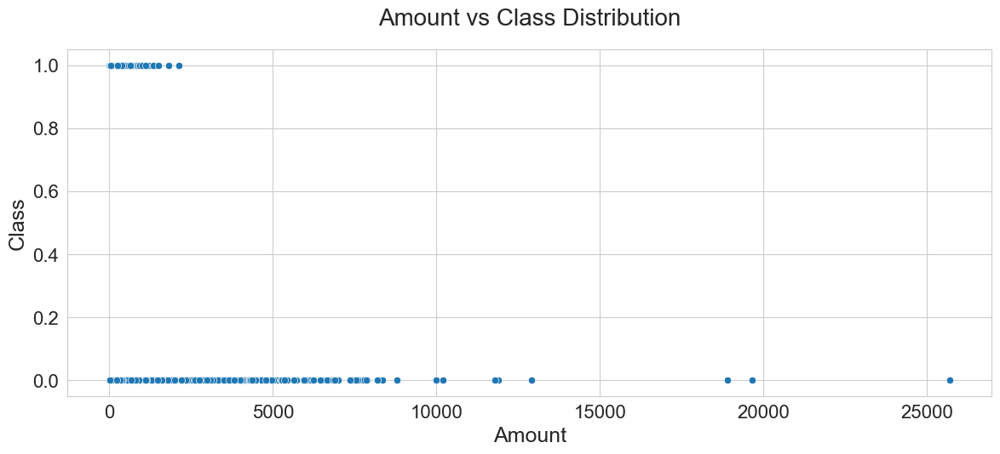

In [30]:
fig = plt.figure(figsize=(14, 18))
cmap = sns.color_palette('Set1')
# PLot the relation between the variables:
plt.subplot(3,1,1)
sns.scatterplot(x=df['Amount'], y='Class', palette=cmap, data=df)
plt.xlabel('Amount', size=18)
plt.ylabel('Class', size=18)
plt.tick_params(axis='x', labelsize=16)
plt.tick_params(axis='y', labelsize=16) 
plt.title('Amount vs Class Distribution', size=20, y=1.05)

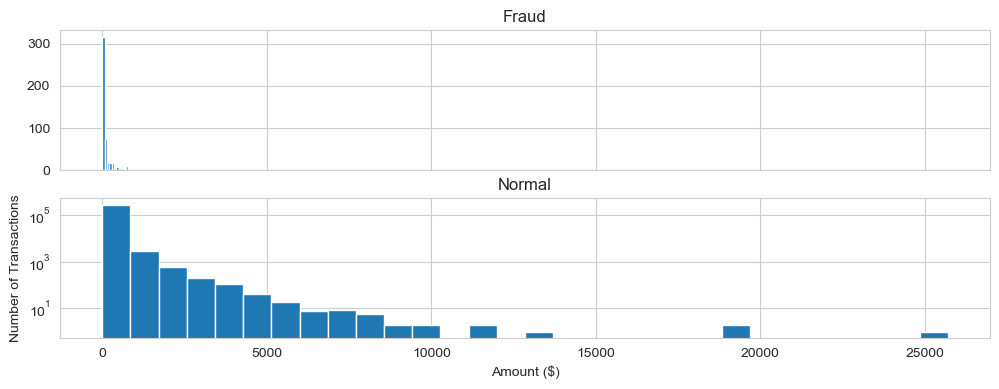

In [31]:
f, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(12,4))
bins = 30
ax1.hist(df.Amount[df.Class == 1], bins = bins)
ax1.set_title('Fraud')
ax2.hist(df.Amount[df.Class == 0], bins = bins)
ax2.set_title('Normal')
plt.xlabel('Amount ($)')
plt.ylabel('Number of Transactions')
plt.yscale('log')
plt.show()

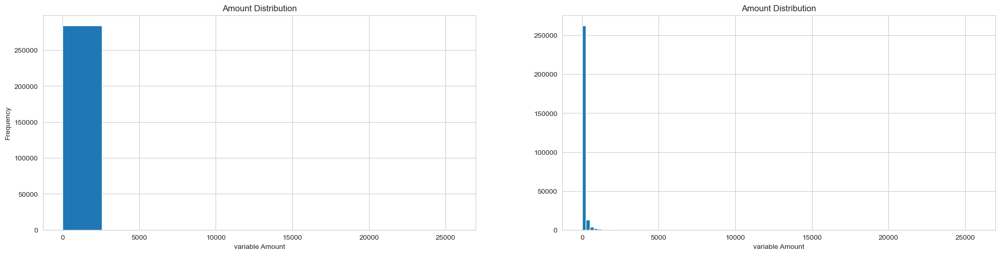

In [32]:
plt.figure(figsize=(24, 12))
plt.subplot(2,2,1)
plt.title('Amount Distribution')
df['Amount'].astype(int).plot.hist();
plt.xlabel("variable Amount")
#plt.ylabel("Frequency")
plt.subplot(2,2,2)
plt.title('Amount Distribution')
sns.set()
plt.xlabel("variable Amount")
plt.hist(df['Amount'],bins=100)
plt.show()

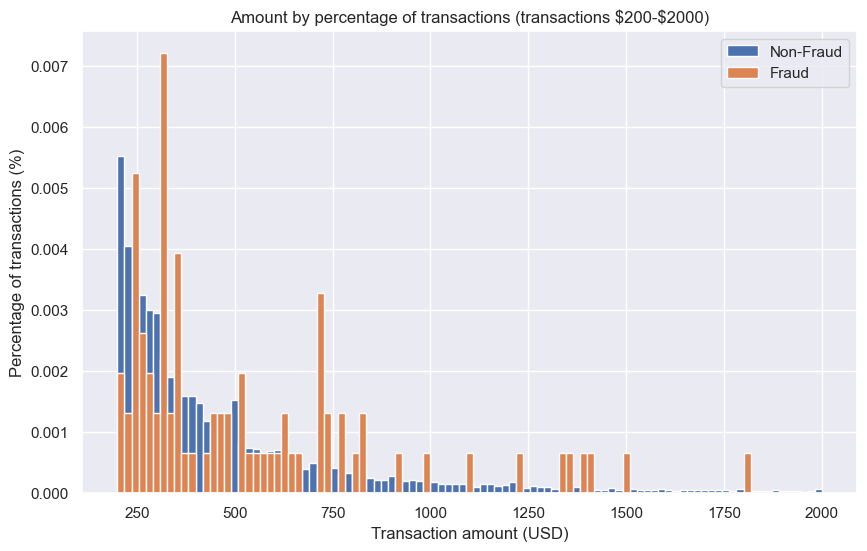

In [33]:
bins = np.linspace(200, 2000, 100)
plt.hist(df_nonfraud.Amount, bins, alpha=1, density=True, label='Non-Fraud')
plt.hist(df_fraud.Amount, bins, alpha=1, density=True, label='Fraud')
plt.legend(loc='upper right')
plt.title("Amount by percentage of transactions (transactions \$200-$2000)")
plt.xlabel("Transaction amount (USD)")
plt.ylabel("Percentage of transactions (%)")
plt.show()

## Visualizing Correlation

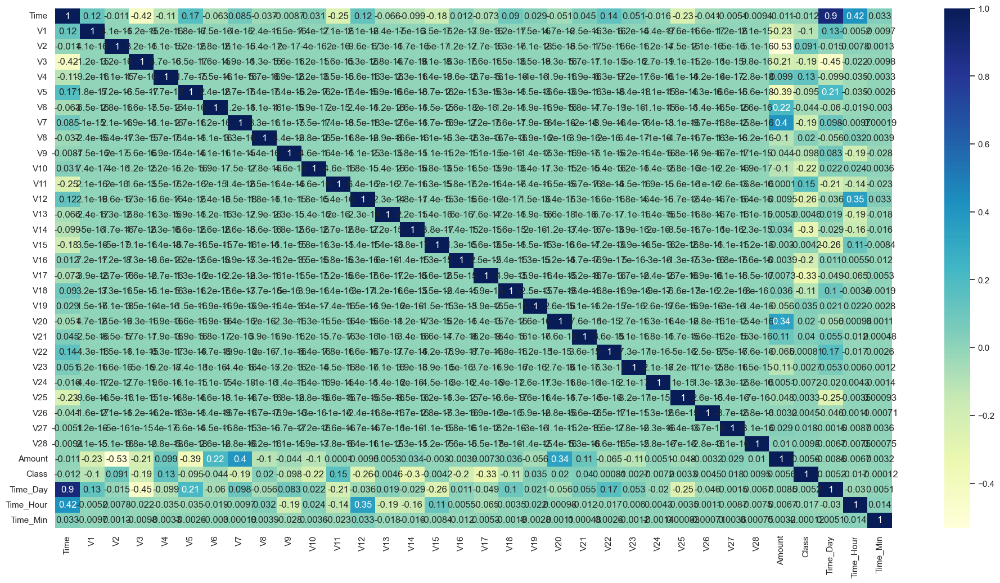

In [34]:
plt.figure(figsize=(24, 12))
sns.heatmap(df.corr(), cmap="YlGnBu", annot=True)
plt.show()

In [35]:
# Understanding more on the correlation in data:
print("Most important features relative to target variable Class")
corr_initial = df.corr()['Class']
# convert series to dataframe so it can be sorted
corr_initial = pd.DataFrame(corr_initial)
# correct column label from SalePrice to correlation
corr_initial.columns = ["Correlation"]
# sort correlation
corr_initial2 = corr_initial.sort_values(by=['Correlation'], ascending=False)
corr_initial2.head(10)

Most important features relative to target variable Class


,Correlation
Class,1.000000
V11,0.154876
V4,0.133447
V2,0.091289
V21,0.040413
V19,0.034783
V20,0.020090
V8,0.019875
V27,0.017580
V28,0.009536


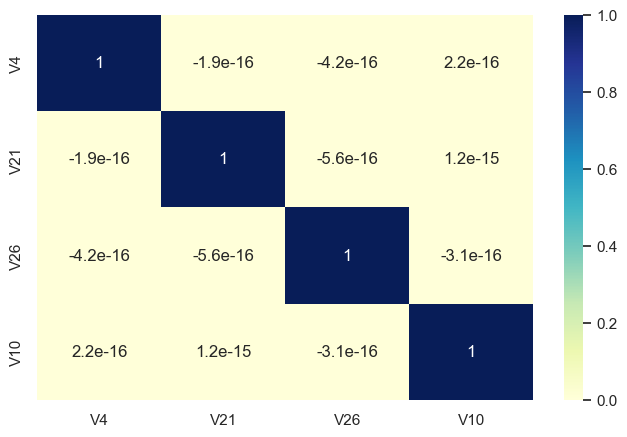

In [36]:
top_feature = corr_initial2.index[abs(df.corr()['Class']>0.09)]
plt.subplots(figsize=(8, 5))
top_corr = df[top_feature].corr()
sns.heatmap(top_corr, annot=True, cmap="YlGnBu")
plt.show()

## Imbalance Analysis

In [40]:
#Check the fraud/Non_Fraud related records
df['Class'].value_counts()

0    284315
1       492
Name: Class, dtype: int64

In [41]:
#Check the percentage of fraud/Non_Fraud related records
df['Class'].value_counts(normalize=True)*100

0    99.827251
1     0.172749
Name: Class, dtype: float64

In [42]:
print('The percentage without churn prediction is ', round(df['Class'].value_counts()[0]/len(df) * 100,2), '% of the dataset')
print('The percentage with churn prediction is ', round(df['Class'].value_counts()[1]/len(df) * 100,2), '% of the dataset')
print('The ratio of imbalance is', round(df['Class'].value_counts()[1]/df['Class'].value_counts()[0] * 100,2))

The percentage without churn prediction is  99.83 % of the dataset
The percentage with churn prediction is  0.17 % of the dataset
The ratio of imbalance is 0.17


### So we have 492 fraudalent transactions out of 284807 total credit card transactions.

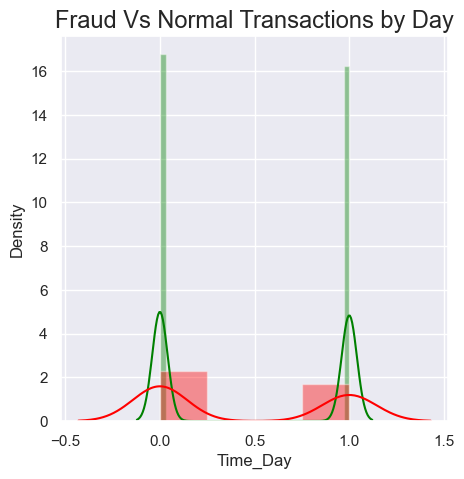

In [43]:
#The fraud Vs normal trasaction by day
plt.figure(figsize=(5,5))
sns.distplot(df[df['Class'] == 0]["Time_Day"], color='green')
sns.distplot(df[df['Class'] == 1]["Time_Day"], color='red')
plt.title('Fraud Vs Normal Transactions by Day', fontsize=17)
plt.show()

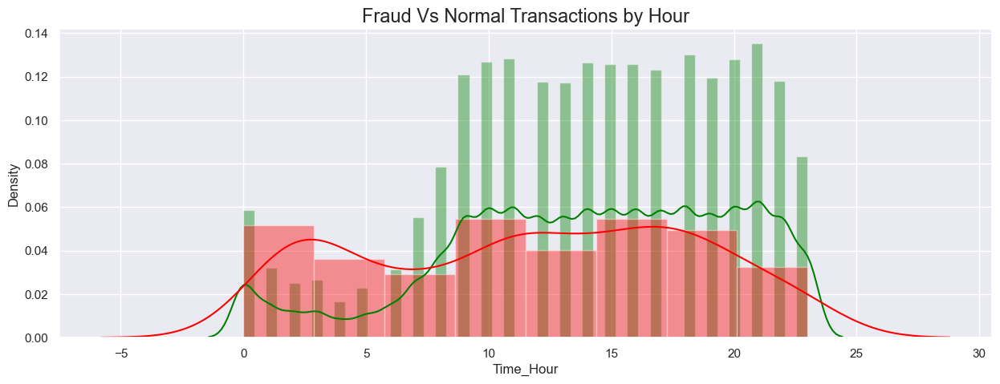

In [44]:
# The fraud Vs normal trasaction by hour
plt.figure(figsize=(15,5))
sns.distplot(df[df['Class'] == 0]["Time_Hour"], color='green')
sns.distplot(df[df['Class'] == 1]["Time_Hour"], color='red')
plt.title('Fraud Vs Normal Transactions by Hour', fontsize=17)
plt.show()

## Delete Unnecessary Colummns

In [45]:
# Drop unnecessary columns
# As we have derived the Day/Hour/Minutes from the time column we will drop Time
df.drop('Time', axis = 1, inplace= True)
#also day/minutes might not be very useful as this is not time series data, we will keep only derived column hour
df.drop(['Time_Day', 'Time_Min'], axis = 1, inplace= True)

In [46]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   V1         284807 non-null  float64
 1   V2         284807 non-null  float64
 2   V3         284807 non-null  float64
 3   V4         284807 non-null  float64
 4   V5         284807 non-null  float64
 5   V6         284807 non-null  float64
 6   V7         284807 non-null  float64
 7   V8         284807 non-null  float64
 8   V9         284807 non-null  float64
 9   V10        284807 non-null  float64
 10  V11        284807 non-null  float64
 11  V12        284807 non-null  float64
 12  V13        284807 non-null  float64
 13  V14        284807 non-null  float64
 14  V15        284807 non-null  float64
 15  V16        284807 non-null  float64
 16  V17        284807 non-null  float64
 17  V18        284807 non-null  float64
 18  V19        284807 non-null  float64
 19  V20        284807 non-n

## Data Preparation

### Train Test Split

In [47]:
# Create X and y dataset for independent and dependent data
y = df['Class']
X = df.drop(['Class'], axis=1)
X.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Time_Hour
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [48]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=100, test_size=0.20)

In [49]:
print(np.sum(y))
print(np.sum(y_train))
print(np.sum(y_test))

492
396
96


## Handling Data Skewness

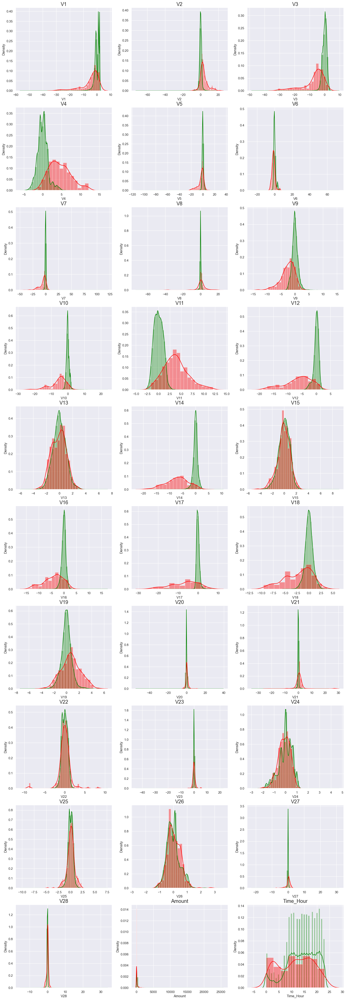

In [50]:
# plot the histogram of a variable from the dataset to see the skewness
cols = list(df.columns.values)
cols.remove('Class')
normal_records = df.Class == 0
fraud_records = df.Class == 1

plt.figure(figsize=(20, 60))
for n, col in enumerate(cols):
    plt.subplot(10,3,n+1)
    sns.distplot(df[col][normal_records], color='green')
    sns.distplot(df[col][fraud_records], color='red')
    plt.title(col, fontsize=17)
plt.show()

In [51]:
# - Apply : preprocessing.PowerTransformer(copy=False) to fit & transform the train & test data
pt = PowerTransformer()
pt.fit(X_train)                       ## Fit the PT on training data
X_train_pt = pt.transform(X_train)    ## Then apply on all data
X_test_pt = pt.transform(X_test)

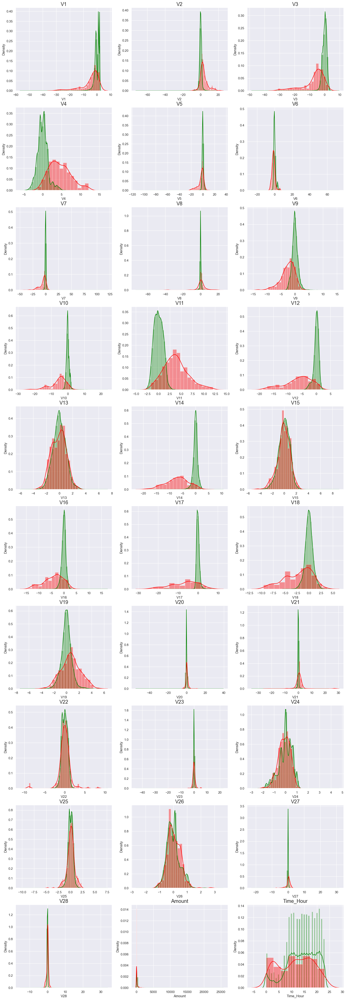

In [52]:
# plot the histogram of a variable from the dataset again to see the result 
cols = list(df.columns.values)
cols.remove('Class')
normal_records = df.Class == 0
fraud_records = df.Class == 1
plt.figure(figsize=(20, 60))
for n, col in enumerate(cols):
    plt.subplot(10,3,n+1)
    sns.distplot(df[col][normal_records], color='green')
    sns.distplot(df[col][fraud_records], color='red')
    plt.title(col, fontsize=17)
plt.show()

## Model Building

In [53]:
# Create a dataframe to store results
df_Results = pd.DataFrame(columns=['Model','Data_Imbalance_Handling','Accuracy on Test Dataset','Recall on Test Dataset','roc_value on Test Dataset','threshold'])

Logistic Regression with L1/L2 regularization
- KNN models
- SVM models
- Decision Trees
- Random Forest
- XGBoost

In [54]:
# function to view model results - confusion matrix and classification report
def plot_model_results(y_test, y_pred_model):
    fig = plt.figure(figsize=(18, 7))
    ax1 = fig.add_subplot(121)
    
    # Plot Confusion matrix
    cf_matrix = confusion_matrix(y_test, y_pred_model)
    group_names = ['True Neg', 'False Pos', 'False Neg', 'True Pos']
    group_counts = ["{0:0.0f}".format(value) for value in cf_matrix.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in cf_matrix.flatten()/np.sum(cf_matrix)]
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='PiYG', linewidth=0.3,
    xticklabels = ["Non-Fraudalent", "Fraudalent"] ,
    yticklabels = ["Non-Fraudalent", "Fraudalent"] )
    plt.title('Confusion Matrix of Test Dataset' , fontweight ="bold")
    plt.ylabel('True labels')
    plt.xlabel('Predicted labels')
    
    # Print classification Report
    ax2 = fig.add_subplot(122)
    # convert a classification report to a pandas Dataframe is by simply having the report returned as a dict
    report = classification_report(y_test, y_pred_model, output_dict=True)
    df = pd.DataFrame(report).transpose()
    ax2.set_axis_off() 
    font_size=12
    class_report_table = ax2.table(cellText = df.values, rowLabels = df.index, colLabels = df.columns, rowColours =["palegreen"] * 10, colColours =["palegreen"] * 10,  loc ='right')         
    class_report_table.auto_set_font_size(False)
    class_report_table.set_fontsize(font_size)
    class_report_table.auto_set_column_width(col=list(range(len(df.columns)))) # Provide integer list of columns to adjust
    ax2.set_title('Classification Report on Test Dataset', fontweight ="bold", loc="right")  

In [55]:
# function to calculate and view model evaluation metrics - ROC curve and Evaluation metrics such as Area under curve score, accuracy and recall
def plot_evaluation_metrics(y_test_model, y_pred_model, y_pred_prob, DataImbalance, model):
    accuracy = round(accuracy_score(y_pred=y_pred_model, y_true=y_test_model),4)
    recall = round(recall_score(y_pred_model, y_test_model),4)
    roc_value = round(roc_auc_score(y_test_model, y_pred_prob),4)
    fpr, tpr, thresholds = roc_curve(y_test_model, y_pred_prob)
    threshold = round(thresholds[np.argmax(tpr-fpr)],4)
    roc_auc = auc(fpr, tpr)
    fig = plt.figure(figsize=(18, 7))
    # AUC-ROC Curve 
    ax1 = fig.add_subplot(121)
    plt.plot(fpr, tpr, label='ROC curve for test dataset(area = %0.2f)' % roc_auc )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic', fontweight ="bold")
    plt.legend(loc="lower right")
    # Print Evaluation metrics
    ax2 = fig.add_subplot(122)
    ax2.axis('off')
    font_size=12
    eval_df = pd.DataFrame({'Data_Imbalance_Handling': DataImbalance,'Model': model,'Accuracy on Test Dataset': accuracy, 'Recall on Test Dataset':recall, 'roc_value on Test Dataset': roc_value,'threshold': threshold}, index=[0])
    df = eval_df.transpose()
    ax2.axis('tight')
    metric_table = ax2.table(cellText = df.values, rowLabels = df.index, colLabels = df.columns, rowColours =["palegreen"] * 10, colColours =["palegreen"] * 10,  loc ='right')         
    metric_table.auto_set_column_width(col=list(range(len(eval_df.columns)))) # Provide integer list of columns to adjust
    metric_table.auto_set_font_size(False)
    metric_table.set_fontsize(font_size)
    ax2.set_title('Evaluation Metrics on Test Dataset', fontweight ="bold", loc="right")    
    plt.show()  
    return(eval_df)

In [56]:
# function to build Logistic regression model
def buildAndRunLogisticModels(df_Results, DataImbalance, X_train,y_train, X_test, y_test ): 
    start_time = time.time()
    num_C = list(np.power(10.0, np.arange(-10, 10)))
    cv_num = KFold(n_splits=10, shuffle=True, random_state=42)
    searchCV_l2 = LogisticRegressionCV(Cs= num_C, penalty='l2', scoring='roc_auc', cv=cv_num, random_state=42, max_iter=10000, fit_intercept=True, solver='newton-cg', tol=10)
    searchCV_l2.fit(X_train, y_train)
    print("Parameters for L2 regularisations: ")
    print(searchCV_l2.coef_)
    print(searchCV_l2.intercept_)  
    # find predicted values
    y_pred_l2 = searchCV_l2.predict(X_test)
    # Find predicted probabilities
    y_pred_probs_l2 = searchCV_l2.predict_proba(X_test)[:,1] 
    plot_model_results(y_test, y_pred_l2) # plot confusion matrix and classification report
    eval_df = plot_evaluation_metrics(y_test, y_pred_l2, y_pred_probs_l2, DataImbalance, "Logistic Regression with L2 Regularization") # Plot ROC curve and Evaluation metrics
    df_Results = pd.concat([df_Results, eval_df])
    l2_time = time.time()
    print("Time Taken by Logistic Regression/L2 RegModel: --- %s seconds ---" % (l2_time - start_time))
    searchCV_l1 = LogisticRegressionCV(Cs=num_C, penalty='l1', scoring='roc_auc', cv=cv_num, random_state=42, max_iter=10000, fit_intercept=True, solver='liblinear', tol=10)
    searchCV_l1.fit(X_train, y_train)
    print("Parameters for l1 regularisations: ")
    print(searchCV_l1.coef_)
    print(searchCV_l1.intercept_) 
    # find predicted values using l1 reg model
    y_pred_l1 = searchCV_l1.predict(X_test)
    # Find predicted probabilities
    y_pred_probs_l1 = searchCV_l1.predict_proba(X_test)[:,1]    
    plot_model_results(y_test, y_pred_l1) # plot confusion matrix and classification report
    eval_df = plot_evaluation_metrics(y_test, y_pred_l1, y_pred_probs_l1, DataImbalance, "Logistic Regression with L1 Regularization")
    df_Results = pd.concat([df_Results, eval_df])
    l1_time = time.time()
    print("Time Taken by Logistic Regression/L1 RegModel: --- %s seconds ---" % (l1_time - start_time))
    return df_Results

In [57]:
# function to build KNN model
def buildAndRunKNNModels(df_Results,DataImbalance, X_train,y_train, X_test, y_test ):
    #create KNN model and fit the model with train dataset
    start_time = time.time()
    knn = KNeighborsClassifier(n_neighbors = 5,n_jobs=16)
    knn.fit(X_train,y_train)
    # Predict on test dataset
    y_pred = knn.predict(X_test)
    knn_probs = knn.predict_proba(X_test)[:, 1]
    plot_model_results(y_test, y_pred) # plot confusion matrix and classification report
    eval_df = plot_evaluation_metrics(y_test, y_pred, knn_probs, DataImbalance, "KNN") # Plot ROC curve and Evaluation metrics
    df_Results = pd.concat([df_Results, eval_df])
    print("Time Taken by KNN Model: --- %s seconds ---" % (time.time() - start_time))
    return df_Results

In [58]:
# function to build SVM model
def buildAndRunSVMModels(df_Results, DataImbalance, X_train,y_train, X_test, y_test ):
    #Evaluate SVM model with sigmoid kernel  model
    start_time = time.time()
    clf = SVC(kernel='sigmoid', random_state=42)
    clf.fit(X_train,y_train)
    y_pred_SVM = clf.predict(X_test)
    # Run classifier
    classifier = SVC(kernel='sigmoid' , probability=True)
    svm_probs = classifier.fit(X_train, y_train).predict_proba(X_test)[:, 1]
    plot_model_results(y_test, y_pred_SVM) # plot confusion matrix and classification report
    eval_df = plot_evaluation_metrics(y_test, y_pred_SVM, svm_probs, DataImbalance, "SVM") # Plot ROC curve and Evaluation metrics
    df_Results = pd.concat([df_Results, eval_df])
    print("Time Taken by SVM Model: --- %s seconds ---" % (time.time() - start_time))
    return df_Results

In [59]:
 #function to build Decision Tree model
def buildAndRunTreeModels(df_Results, DataImbalance, X_train,y_train, X_test, y_test ):
    # Evaluate Decision Tree model with 'gini' & 'entropy'
    criteria = ['gini', 'entropy'] 
    scores = {} 

    for c in criteria: 
        start_time = time.time()
        dt = DecisionTreeClassifier(criterion = c, random_state=42) 
        dt.fit(X_train, y_train) 
        y_pred = dt.predict(X_test)
        test_score = dt.score(X_test, y_test) 
        tree_preds = dt.predict_proba(X_test)[:, 1]
        
        plot_model_results(y_test, y_pred) # plot confusion matrix and classification report
        eval_df = plot_evaluation_metrics(y_test, y_pred, tree_preds, DataImbalance, "Tree model with {0} criteria".format(c)) # Plot ROC curve and Evaluation metrics
        df_Results = pd.concat([df_Results, eval_df])
        
        print("Time Taken by Tree Model with %s criteria: --- %s seconds ---" % (c, time.time() - start_time))
    return df_Results

In [60]:
# function to build Random Forest model
def buildAndRunRandomForestModels(df_Results, DataImbalance, X_train,y_train, X_test, y_test ):
    start_time = time.time()
    # Create the model with 100 trees
    RF_model = RandomForestClassifier(n_estimators=100, bootstrap = True, max_features = 'sqrt', random_state=42)
    # Fit on training data
    RF_model.fit(X_train, y_train)
    y_pred = RF_model.predict(X_test)

    # Actual class predictions
    rf_predictions = RF_model.predict(X_test)

    # Probabilities for each class
    rf_probs = RF_model.predict_proba(X_test)[:, 1]

    plot_model_results(y_test, y_pred) # plot confusion matrix and classification report
    eval_df = plot_evaluation_metrics(y_test, y_pred, rf_probs, DataImbalance, "Random Forest") # Plot ROC curve and Evaluation metrics
    df_Results = pd.concat([df_Results, eval_df])
    
    print("Time Taken by Random Forest Model: --- %s seconds ---" % (time.time() - start_time))
    return df_Results

In [61]:
# function to build XGBoost model
def buildAndRunXGBoostModels(df_Results, DataImbalance,X_train,y_train, X_test, y_test ):
    start_time = time.time()
    # fit model no training data
    XGBmodel = XGBClassifier(random_state=42)
    XGBmodel.fit(X_train, y_train)
    y_pred = XGBmodel.predict(X_test)
    # Probabilities for each class
    XGB_probs = XGBmodel.predict_proba(X_test)[:, 1]
    plot_model_results(y_test, y_pred) # plot confusion matrix and classification report
    eval_df = plot_evaluation_metrics(y_test, y_pred, XGB_probs, DataImbalance, "XGBoost") # Plot ROC curve and Evaluation metrics
    df_Results = pd.concat([df_Results, eval_df])
    print("Time Taken by XGBoost Model: --- %s seconds ---" % (time.time() - start_time))
    return df_Results

## Model Building on imbalanced dataset

We will feed the raw data(imbalanced) which is power transformed to below models:

1. Logistic Regression with L2 Regularisation
2. Logistic Regression with L1 Regularisation
3. KNN
4. Decision tree model with Gini criteria
5. Decision tree model with Entropy criteria
6. Random Forest
7. XGBoost
8. SVM Model 

Logistic Regression with L1 And L2 Regularisation
Parameters for L2 regularisations: 
[[-0.09276541 -0.06828297 -0.28652331  0.55493742  0.02789795  0.01396825
  -0.06824953 -0.20408006 -0.18143666 -0.20371291  0.17699968 -0.50183428
  -0.11614819 -0.66830552 -0.0815942  -0.18013738 -0.08164992  0.03866812
  -0.03807332 -0.02310099  0.10465199  0.10090233 -0.03198749 -0.02939204
   0.01001787  0.00785392 -0.04474827 -0.02229527  0.02208228  0.08474082]]
[-8.07230494]


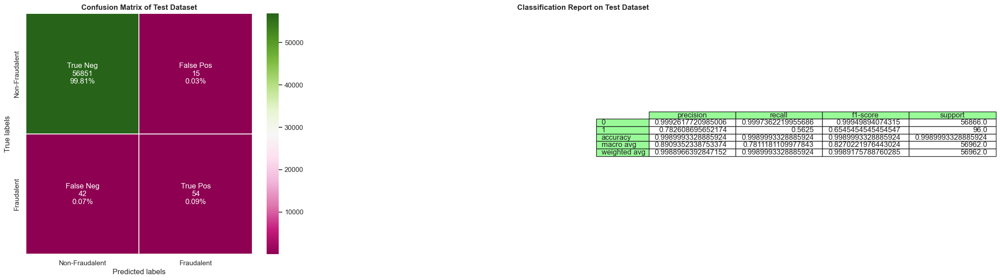

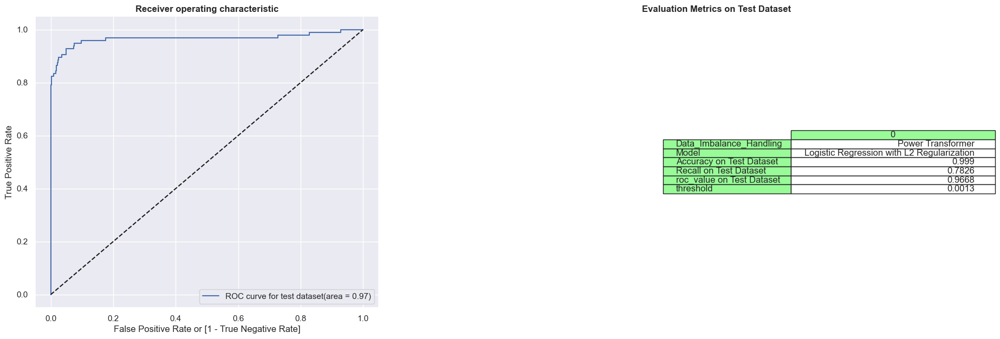

Time Taken by Logistic Regression/L2 RegModel: --- 61.1097252368927 seconds ---
Parameters for l1 regularisations: 
[[-6.61265219e-02  4.49703861e-02 -1.36022458e-01  1.29471526e-01
  -3.06095820e-02 -3.04752581e-02 -9.79459409e-02 -9.51477709e-02
  -9.71547836e-02 -1.64878553e-01  1.34577916e-01 -2.12506874e-01
  -5.48417939e-03 -2.68605590e-01 -2.07912446e-02 -1.12252328e-01
  -1.63818683e-01 -4.23148010e-02  7.58772465e-03  1.13676916e-03
   2.23400941e-02  1.03609858e-02 -1.57601271e-03 -1.48521551e-02
  -1.51923337e-03  4.85100137e-03  1.37752804e-03 -6.07978926e-03
   1.10025454e-04  2.45651822e-03]]
[-5.10793407]


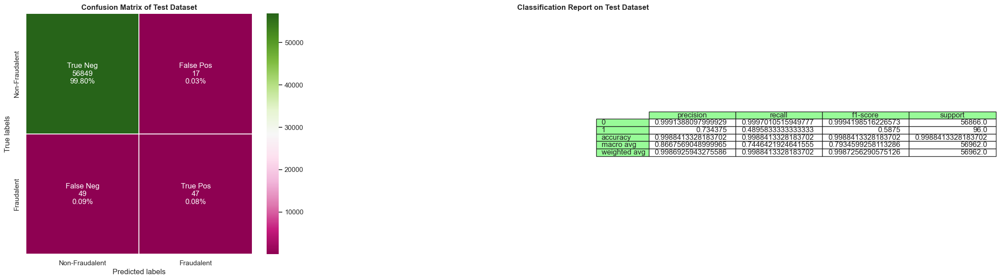

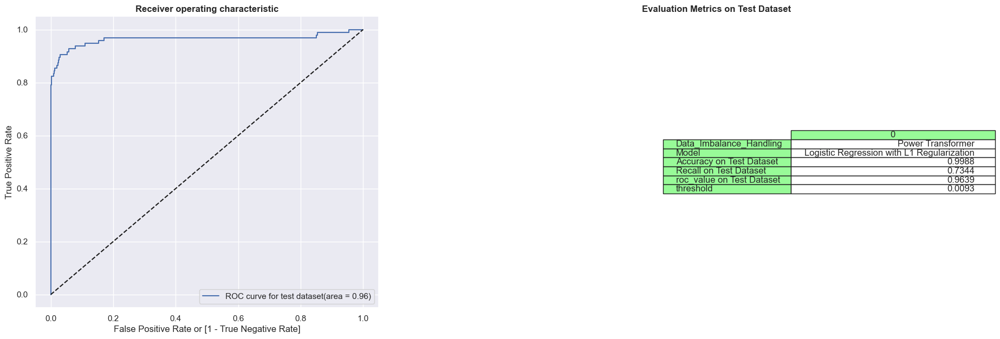

Time Taken by Logistic Regression/L1 RegModel: --- 144.34875202178955 seconds ---


In [63]:
print("Logistic Regression with L1 And L2 Regularisation")
df_Results = buildAndRunLogisticModels(df_Results,"Power Transformer",X_train_pt,y_train, X_test_pt, y_test)

KNN Model


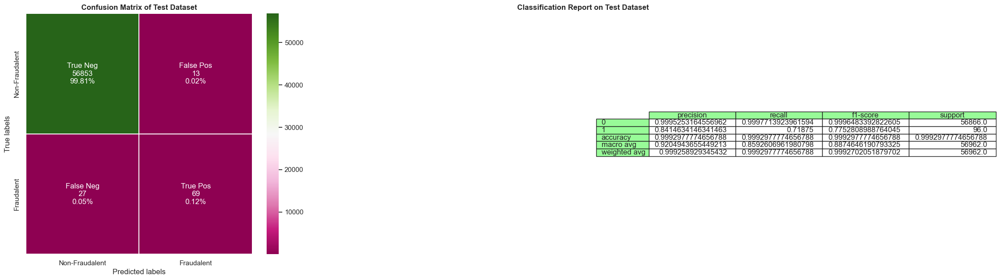

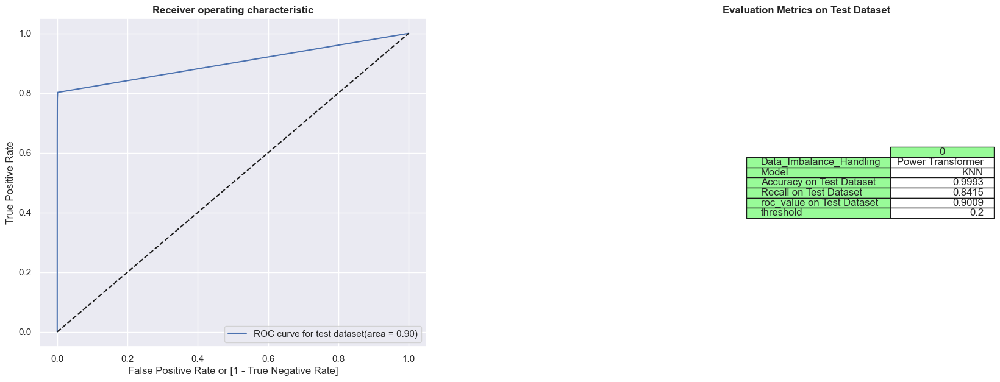

Time Taken by KNN Model: --- 1234.4007904529572 seconds ---


In [64]:
# Run KNN Model
print("KNN Model")
df_Results = buildAndRunKNNModels(df_Results,"Power Transformer",X_train_pt,y_train, X_test_pt, y_test)

Decision Tree Models with  'gini' & 'entropy' criteria


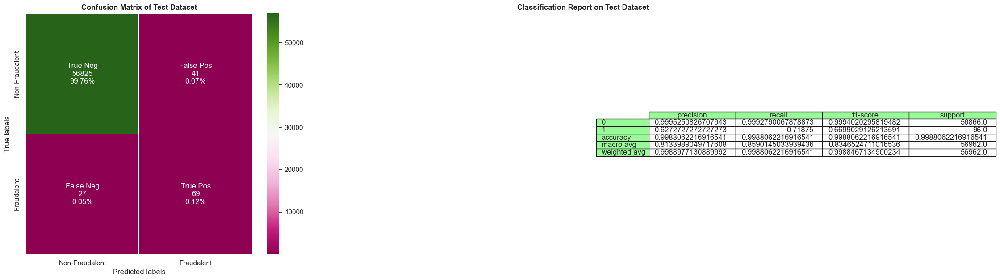

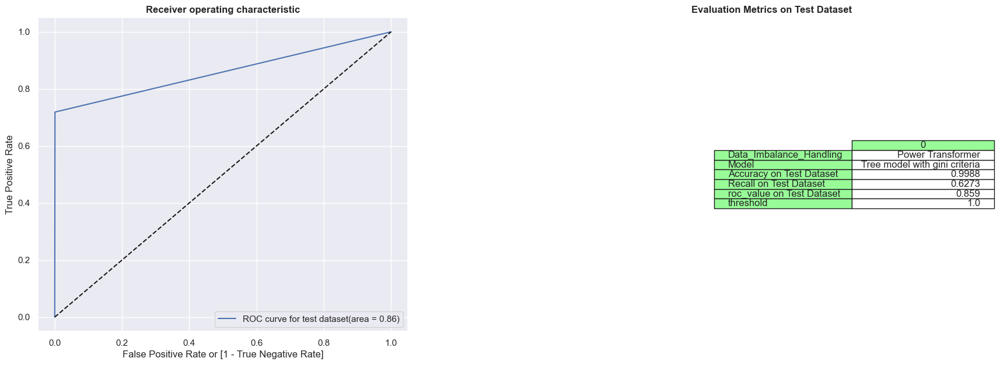

Time Taken by Tree Model with gini criteria: --- 22.98822593688965 seconds ---


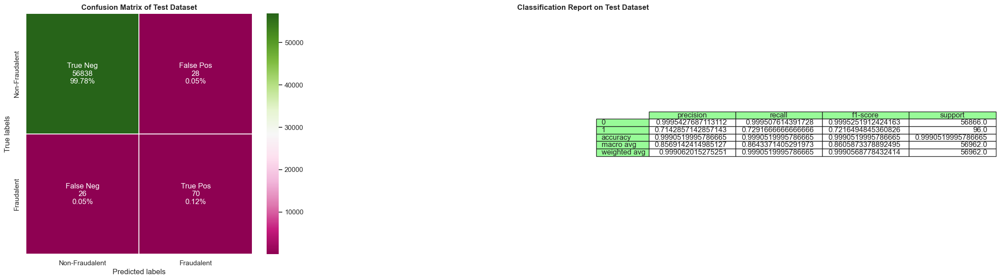

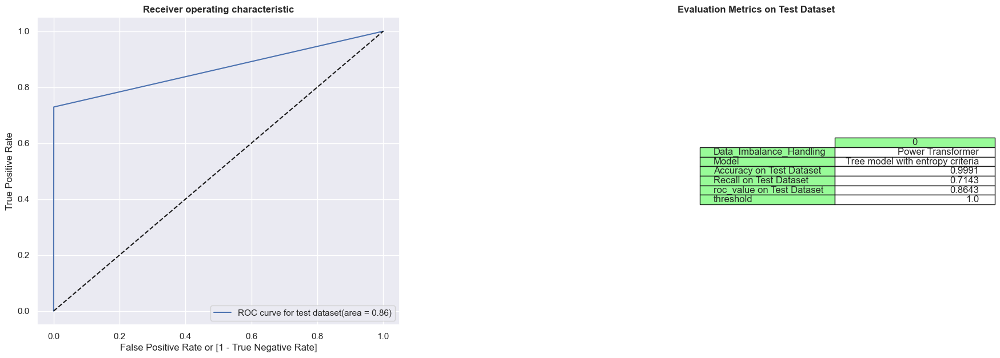

Time Taken by Tree Model with entropy criteria: --- 16.074427843093872 seconds ---


In [65]:
#Run Decision Tree Models with  'gini' & 'entropy' criteria
print("Decision Tree Models with  'gini' & 'entropy' criteria")
df_Results = buildAndRunTreeModels(df_Results,"Power Transformer",X_train_pt,y_train, X_test_pt, y_test)

In [ ]:
#Run Random Forest Model
print("Random Forest Model")
df_Results = buildAndRunRandomForestModels(df_Results,"Power Transformer",X_train_pt,y_train, X_test_pt, y_test)

XGBoost Model


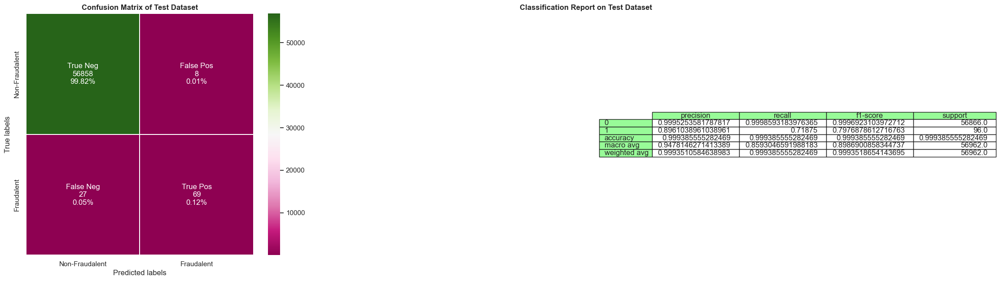

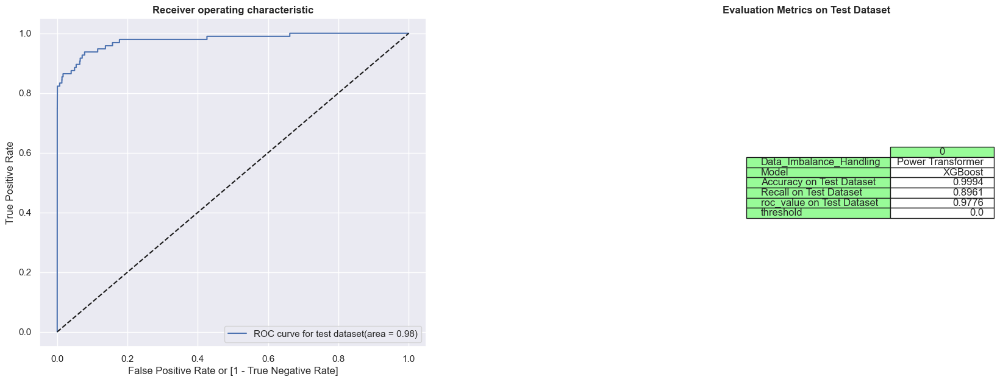

Time Taken by XGBoost Model: --- 4.6527838706970215 seconds ---


In [66]:
#Run XGBoost Model
print("XGBoost Model")
df_Results = buildAndRunXGBoostModels(df_Results,"Power Transformer",X_train_pt,y_train, X_test_pt, y_test)

In [ ]:
#Run SVM Model with Sigmoid Kernel
print("SVM Model with Sigmoid Kernel")
df_Results = buildAndRunSVMModels(df_Results,"Power Transformer",X_train_pt,y_train, X_test_pt, y_test)

In [ ]:
df_Results

#### We will feed the raw data(imbalanced) which is created by cross validation with RepeatedKFold to below models:

1. Logistic Regression with L2 Regularisation
2. Logistic Regression with L1 Regularisation
3. KNN
4. Decision tree model with Gini criteria
5. Decision tree model with Entropy criteria
6. Random Forest
7. XGBoost
8. SVM Model

In [ ]:
# Lets perfrom RepeatedKFold and check the results
rkf = RepeatedKFold(n_splits=5, n_repeats=10, random_state=None)
# X is the feature set and y is the target
for train_index, test_index in rkf.split(X,y):
    print("TRAIN:", train_index, "TEST:", test_index)
    X_train_cv, X_test_cv = X.iloc[train_index], X.iloc[test_index]
    y_train_cv, y_test_cv = y.iloc[train_index], y.iloc[test_index]

In [ ]:
#Run Logistic Regression with L1 And L2 Regularisation
print("Logistic Regression with L1 And L2 Regularisation")
df_Results = buildAndRunLogisticModels(df_Results,"RepeatedKFold Cross Validation", X_train_cv,y_train_cv, X_test_cv, y_test_cv)

In [ ]:
Run# KNN Model
print("KNN Model")
df_Results = buildAndRunKNNModels(df_Results,"RepeatedKFold Cross Validation",X_train_cv,y_train_cv, X_test_cv, y_test_cv)

In [ ]:
#Run Decision Tree Models with  'gini' & 'entropy' criteria
print("Decision Tree Models with  'gini' & 'entropy' criteria")
df_Results = buildAndRunTreeModels(df_Results,"RepeatedKFold Cross Validation",X_train_cv,y_train_cv, X_test_cv, y_test_cv)

In [ ]:
#Run Random Forest Model
print("Random Forest Model")
df_Results = buildAndRunRandomForestModels(df_Results,"RepeatedKFold Cross Validation",X_train_cv,y_train_cv, X_test_cv, y_test_cv)

In [ ]:
#Run XGBoost Model
print("XGBoost Model")
df_Results = buildAndRunXGBoostModels(df_Results,"RepeatedKFold Cross Validation",X_train_cv,y_train_cv, X_test_cv, y_test_cv)

In [ ]:
#Run SVM Model with Sigmoid Kernel
print("SVM Model with Sigmoid Kernel")
df_Results = buildAndRunSVMModels(df_Results,"RepeatedKFold Cross Validation",X_train_cv,y_train_cv, X_test_cv, y_test_cv)

In [ ]:
df_Results

In [ ]:
# Evaluate XGboost model
# fit model no training data
XGBmodel = XGBClassifier(random_state=42)
XGBmodel.fit(X_train_cv,y_train_cv)
coefficients = pd.concat([pd.DataFrame(X.columns),pd.DataFrame(np.transpose(XGBmodel.feature_importances_))], axis = 1)
coefficients.columns = ['Feature','feature_importances']

In [ ]:
plt.figure(figsize=(20,5)) # to be deleted
sns.barplot(x='Feature', y='feature_importances', data=coefficients)
plt.title("XGBoost with Repeated KFold Feature Importance", fontsize=18)
plt.show()

#### We will feed the raw data(imbalanced) which is created by cross validation and StratifiedKFold to below models

1. Logistic Regression with L2 Regularisation
2. Logistic Regression with L1 Regularisation
3. KNN
4. Decision tree model with Gini criteria
5. Decision tree model with Entropy criteria
6. Random Forest
7. XGBoost
8. SVM Model

In [70]:
# Lets perfrom StratifiedKFold and check the results
skf = StratifiedKFold(n_splits=5, random_state=None)
# X is the feature set and y is the target
for train_index, test_index in skf.split(X,y):
    print("TRAIN:", train_index, "TEST:", test_index)
    X_train_SKF_cv, X_test_SKF_cv = X.iloc[train_index], X.iloc[test_index]
    y_train_SKF_cv, y_test_SKF_cv = y.iloc[train_index], y.iloc[test_index]

TRAIN: [ 30473  30496  31002 ... 284804 284805 284806] TEST: [    0     1     2 ... 57017 57018 57019]
TRAIN: [     0      1      2 ... 284804 284805 284806] TEST: [ 30473  30496  31002 ... 113964 113965 113966]
TRAIN: [     0      1      2 ... 284804 284805 284806] TEST: [ 81609  82400  83053 ... 170946 170947 170948]
TRAIN: [     0      1      2 ... 284804 284805 284806] TEST: [150654 150660 150661 ... 227866 227867 227868]
TRAIN: [     0      1      2 ... 227866 227867 227868] TEST: [212516 212644 213092 ... 284804 284805 284806]


Logistic Regression with L1 And L2 Regularisation
Parameters for L2 regularisations: 
[[ 0.00670249  0.06138279 -0.06684886  0.21849491  0.05382125 -0.03190808
  -0.02274127 -0.11489991 -0.06981392 -0.16362226  0.12764068 -0.19118072
  -0.03738735 -0.36085825  0.00374649 -0.08794909 -0.07288047 -0.00079393
   0.00394226 -0.02801998  0.03813664  0.02334834 -0.01171689 -0.00997961
  -0.00653709  0.00628187 -0.01014401 -0.00171244  0.00039733 -0.00121052]]
[-7.40290664]


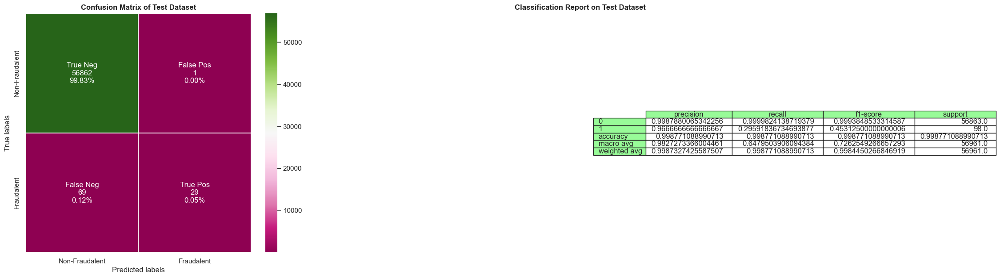

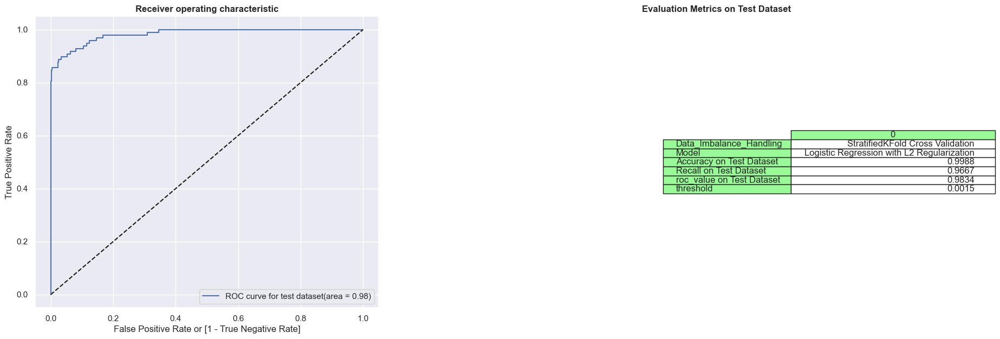

Time Taken by Logistic Regression/L2 RegModel: --- 186.4115068912506 seconds ---
Parameters for l1 regularisations: 
[[-0.03660539 -0.1358827  -0.20474594  0.04333662 -0.24034598  0.08416903
   0.12654905 -0.04815306 -0.14258132 -0.1384162  -0.11668372  0.05505155
  -0.15637116 -0.24216184 -0.03137093 -0.09904364 -0.23133976  0.05582481
   0.02122044  0.20503748  0.09013502  0.00148754 -0.03796378 -0.00392139
  -0.14797782 -0.00701001 -0.06594801 -0.00660368 -0.00656465 -0.12981985]]
[-2.0409044]


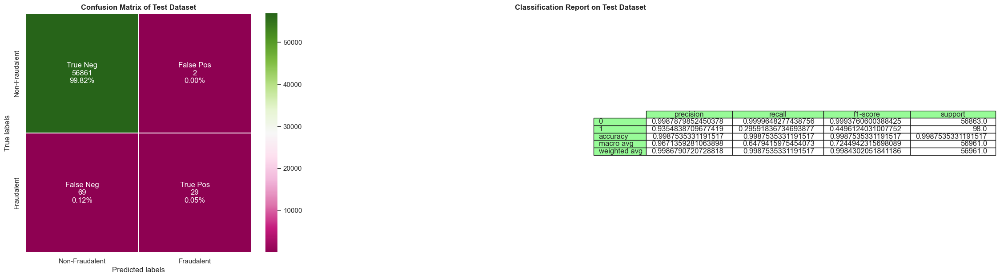

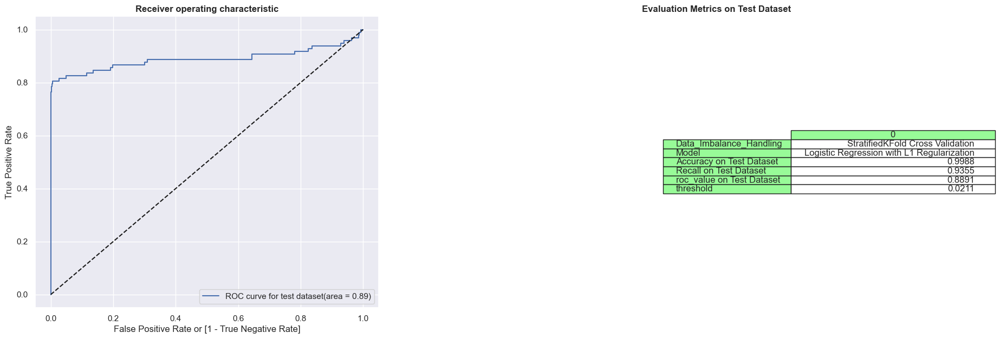

Time Taken by Logistic Regression/L1 RegModel: --- 275.1944010257721 seconds ---


In [71]:
#Run Logistic Regression with L1 And L2 Regularisation
print("Logistic Regression with L1 And L2 Regularisation")
df_Results = buildAndRunLogisticModels(df_Results,"StratifiedKFold Cross Validation", X_train_SKF_cv,y_train_SKF_cv, X_test_SKF_cv, y_test_SKF_cv)

KNN Model


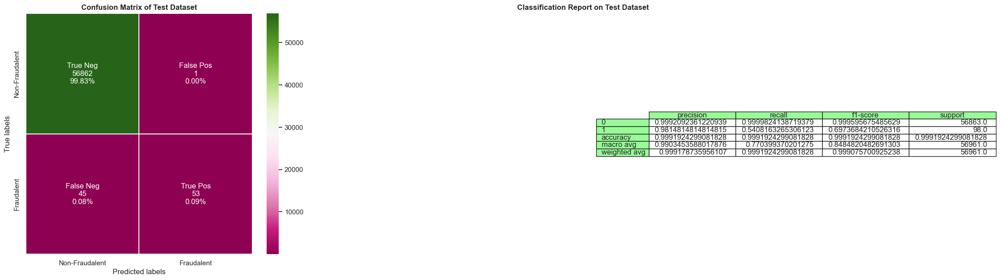

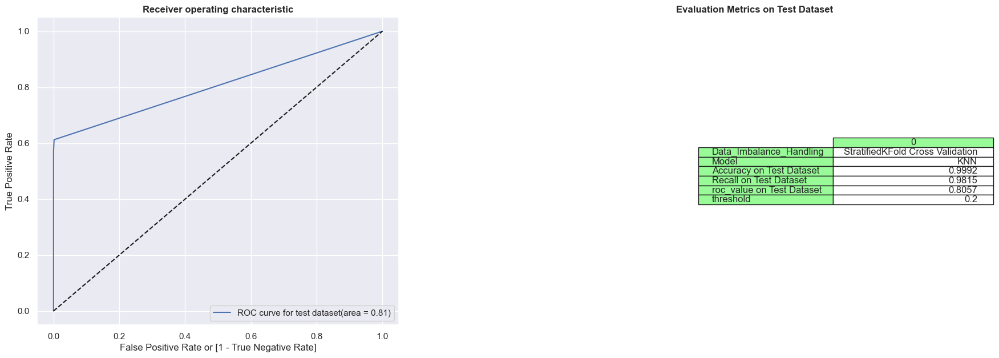

Time Taken by KNN Model: --- 114.8563437461853 seconds ---


In [72]:
#Run KNN Model
print("KNN Model")
df_Results = buildAndRunKNNModels(df_Results,"StratifiedKFold Cross Validation",X_train_SKF_cv,y_train_SKF_cv, X_test_SKF_cv, y_test_SKF_cv)

Decision Tree Models with  'gini' & 'entropy' criteria


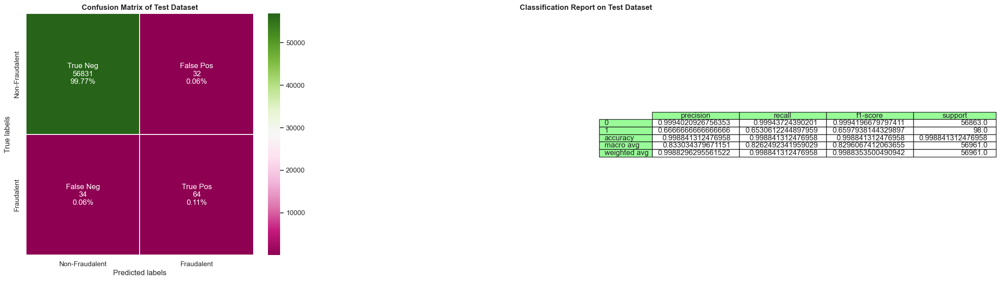

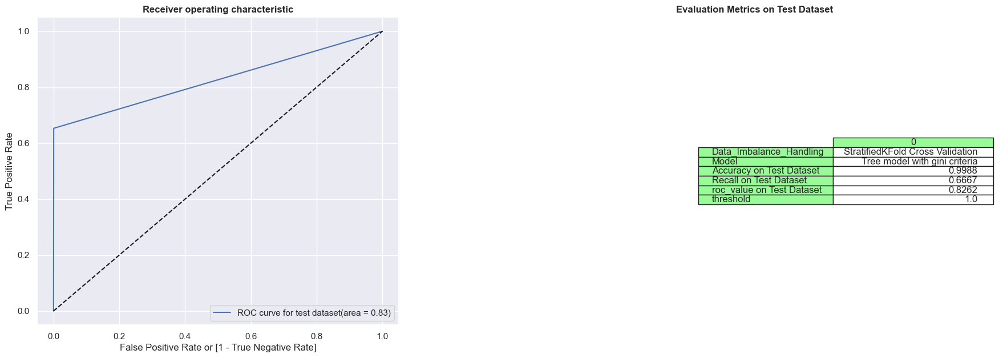

Time Taken by Tree Model with gini criteria: --- 48.65595579147339 seconds ---


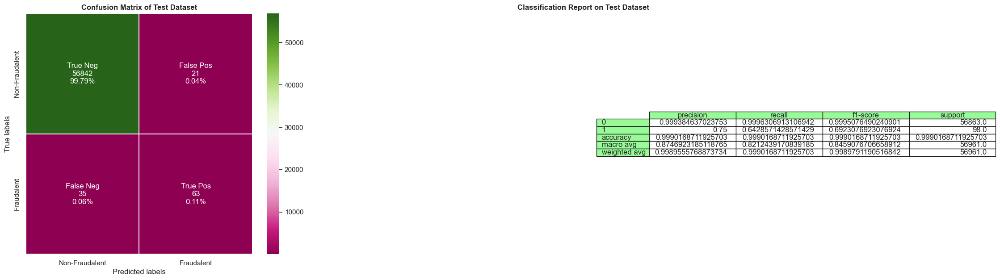

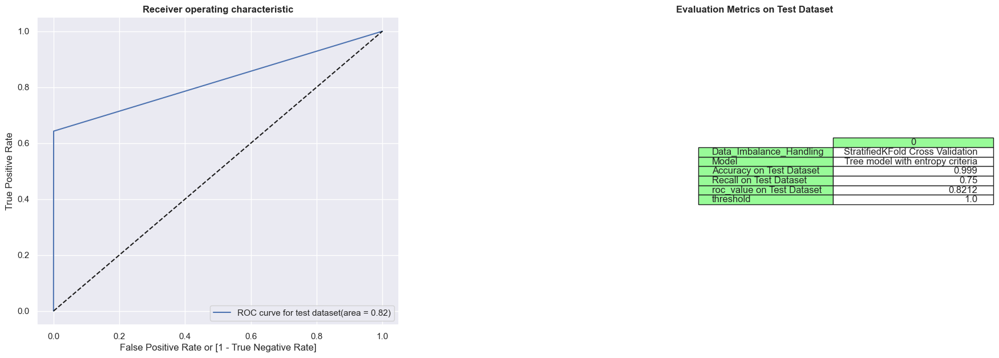

Time Taken by Tree Model with entropy criteria: --- 24.255458116531372 seconds ---


In [73]:
#Run Decision Tree Models with  'gini' & 'entropy' criteria
print("Decision Tree Models with  'gini' & 'entropy' criteria")
df_Results = buildAndRunTreeModels(df_Results,"StratifiedKFold Cross Validation",X_train_SKF_cv,y_train_SKF_cv, X_test_SKF_cv, y_test_SKF_cv)

Random Forest Model


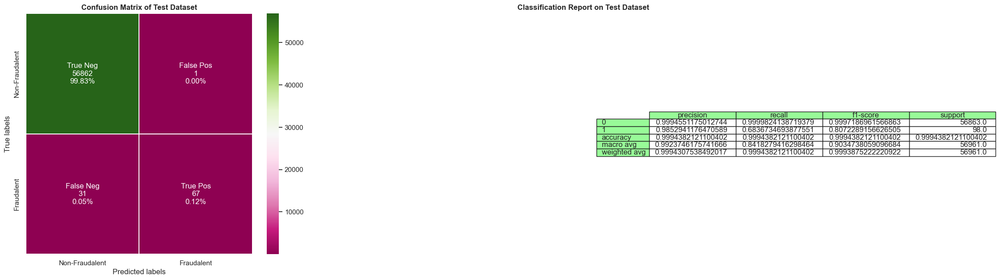

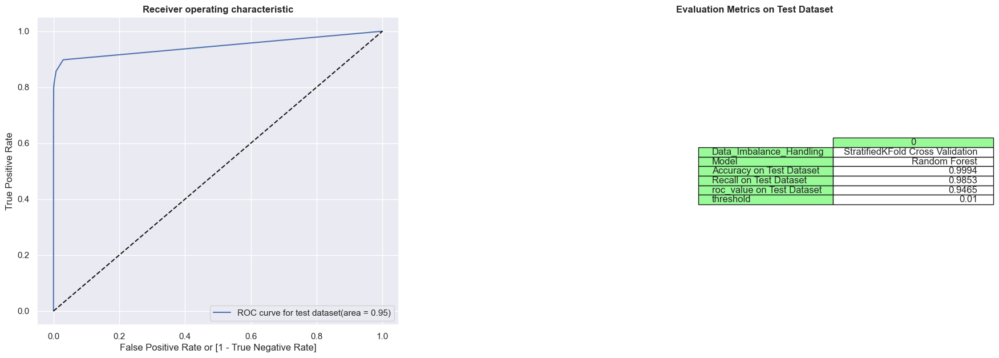

Time Taken by Random Forest Model: --- 526.0929656028748 seconds ---


In [74]:
#Run Random Forest Model
print("Random Forest Model")
df_Results = buildAndRunRandomForestModels(df_Results,"StratifiedKFold Cross Validation",X_train_SKF_cv,y_train_SKF_cv, X_test_SKF_cv, y_test_SKF_cv)

XGBoost Model


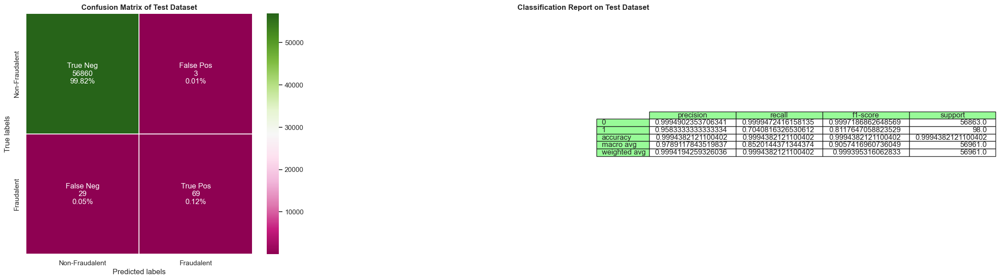

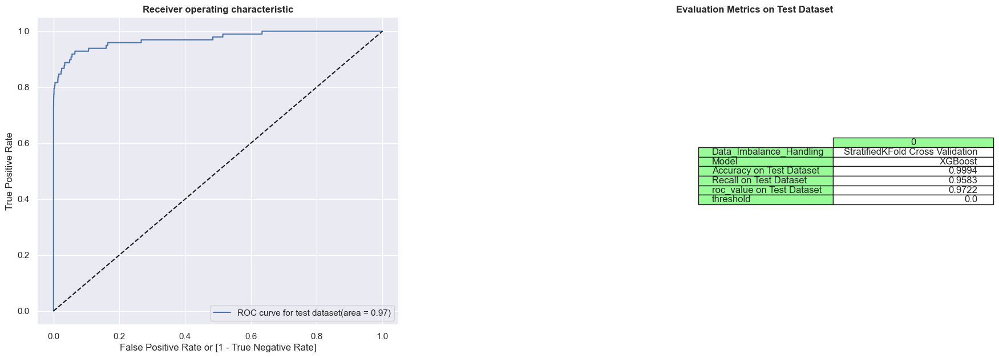

Time Taken by XGBoost Model: --- 5.803174018859863 seconds ---


In [75]:
#Run XGBoost Model
print("XGBoost Model")
df_Results = buildAndRunXGBoostModels(df_Results,"StratifiedKFold Cross Validation",X_train_SKF_cv,y_train_SKF_cv, X_test_SKF_cv, y_test_SKF_cv)

SVM Model with Sigmoid Kernel


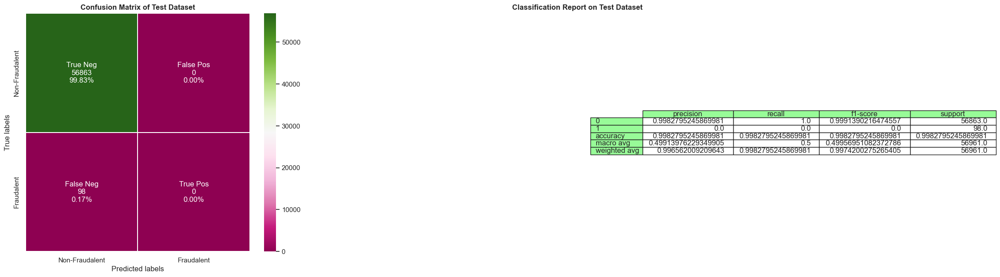

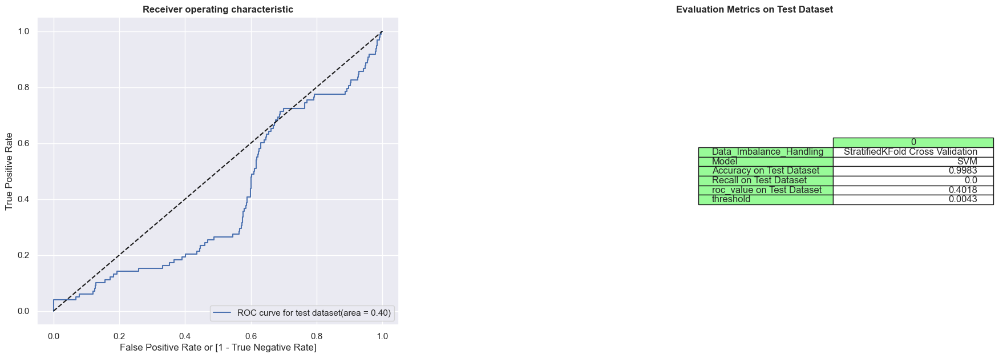

Time Taken by SVM Model: --- 208.218731880188 seconds ---


In [76]:
#Run SVM Model with Sigmoid Kernel
print("SVM Model with Sigmoid Kernel")
df_Results = buildAndRunSVMModels(df_Results,"StratifiedKFold Cross Validation",X_train_SKF_cv,y_train_SKF_cv, X_test_SKF_cv, y_test_SKF_cv)

In [77]:
df_Results

,Model,Data_Imbalance_Handling,Accuracy on Test Dataset,Recall on Test Dataset,roc_value on Test Dataset,threshold
0,Logistic Regression with L2 Regularization,Power Transformer,0.9990,0.7826,0.9668,0.0013
0,Logistic Regression with L1 Regularization,Power Transformer,0.9988,0.7344,0.9639,0.0093
0,KNN,Power Transformer,0.9993,0.8415,0.9009,0.2000
0,Tree model with gini criteria,Power Transformer,0.9988,0.6273,0.8590,1.0000
0,Tree model with entropy criteria,Power Transformer,0.9991,0.7143,0.8643,1.0000
0,Random Forest,Power Transformer,0.9994,0.8831,0.9406,0.0100
0,XGBoost,Power Transformer,0.9994,0.8961,0.9776,0.0000
0,SVM,Power Transformer,0.9986,0.5686,0.8913,0.0009
0,Logistic Regression with L2 Regularization,StratifiedKFold Cross Validation,0.9988,0.9667,0.9834,0.0015
0,Logistic Regression with L1 Regularization,StratifiedKFold Cross Validation,0.9988,0.9355,0.8891,0.0211


In [78]:
# Logistic Regression
num_C = list(np.power(10.0, np.arange(-10, 10)))
cv_num = KFold(n_splits=10, shuffle=True, random_state=42)
searchCV_l2 = LogisticRegressionCV(
          Cs= num_C
          ,penalty='l2'
          ,scoring='roc_auc'
          ,cv=cv_num
          ,random_state=42
          ,max_iter=10000
          ,fit_intercept=True
          ,solver='newton-cg'
          ,tol=10
      )
searchCV_l2.fit(X_train, y_train)
print ('Max auc_roc for l2:', searchCV_l2.scores_[1].mean(axis=0).max())
print("Parameters for l2 regularisations")
print(searchCV_l2.coef_)
print(searchCV_l2.intercept_) 
print(searchCV_l2.scores_) 
#find predicted vallues
y_pred_l2 = searchCV_l2.predict(X_test)
#Find predicted probabilities
y_pred_probs_l2 = searchCV_l2.predict_proba(X_test)[:,1] 
# Accuracy of L2/L1 models
Accuracy_l2 = accuracy_score(y_pred=y_pred_l2, y_true=y_test)
print("Accuracy of Logistic model with l2 regularisation : {0}".format(Accuracy_l2))
l2_roc_value = roc_auc_score(y_test, y_pred_probs_l2)
print("l2 roc_value: {0}" .format(l2_roc_value))
fpr, tpr, thresholds = roc_curve(y_test, y_pred_probs_l2)
threshold = thresholds[np.argmax(tpr-fpr)]
print("l2 threshold: {0}".format(threshold))

Max auc_roc for l2: 0.9859875004683667
Parameters for l2 regularisations
[[ 2.10697021e-02  3.25431988e-02 -8.94040749e-02  2.36653159e-01
   8.32351645e-02 -4.90338784e-02 -3.28028734e-02 -1.08052527e-01
  -9.19005730e-02 -1.74737492e-01  1.35506341e-01 -2.08002646e-01
  -4.28728043e-02 -3.77390993e-01 -1.08247914e-02 -1.04553788e-01
  -1.14545245e-01 -8.59164538e-03  1.49272637e-02 -5.58367258e-03
   3.94581715e-02  2.42742827e-02  1.91807122e-03 -1.57043058e-02
  -7.90569150e-03  5.15312620e-03 -3.35172586e-03 -2.10380162e-04
   3.03359612e-04  4.10847250e-03]]
[-7.4884364]
{1: array([[0.58216478, 0.5843407 , 0.6102234 , 0.77826009, 0.94270322,
        0.98595298, 0.99602058, 0.99404614, 0.99427569, 0.99499123,
        0.99499123, 0.99267611, 0.99267611, 0.99267611, 0.99267611,
        0.99267611, 0.99267611, 0.99267611, 0.99267611, 0.99267611],
       [0.56053774, 0.5622791 , 0.57893383, 0.72017649, 0.8896713 ,
        0.93921017, 0.9756895 , 0.97645223, 0.97906362, 0.98027107,
   

In [79]:
searchCV_l2.coef_

array([[ 2.10697021e-02,  3.25431988e-02, -8.94040749e-02,
         2.36653159e-01,  8.32351645e-02, -4.90338784e-02,
        -3.28028734e-02, -1.08052527e-01, -9.19005730e-02,
        -1.74737492e-01,  1.35506341e-01, -2.08002646e-01,
        -4.28728043e-02, -3.77390993e-01, -1.08247914e-02,
        -1.04553788e-01, -1.14545245e-01, -8.59164538e-03,
         1.49272637e-02, -5.58367258e-03,  3.94581715e-02,
         2.42742827e-02,  1.91807122e-03, -1.57043058e-02,
        -7.90569150e-03,  5.15312620e-03, -3.35172586e-03,
        -2.10380162e-04,  3.03359612e-04,  4.10847250e-03]])

In [80]:
coefficients = pd.concat([pd.DataFrame(X.columns),pd.DataFrame(np.transpose(searchCV_l2.coef_))], axis = 1)
coefficients.columns = ['Feature','Importance Coefficient']

In [81]:
coefficients

,Feature,Importance Coefficient
0,V1,0.021070
1,V2,0.032543
2,V3,-0.089404
3,V4,0.236653
4,V5,0.083235
5,V6,-0.049034
6,V7,-0.032803
7,V8,-0.108053
8,V9,-0.091901
9,V10,-0.174737


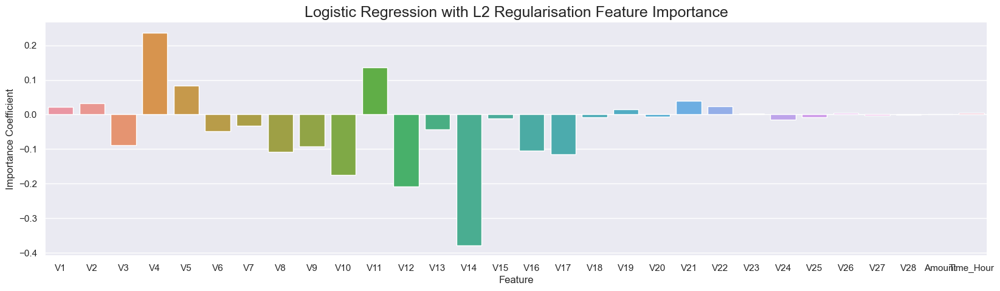

In [82]:
plt.figure(figsize=(20,5))
sns.barplot(x='Feature', y='Importance Coefficient', data=coefficients)
plt.title("Logistic Regression with L2 Regularisation Feature Importance", fontsize=18)
plt.show()

### We will feed the balanced data which is created by Random Undersampling(RUS) to below models:

1. Logistic Regression with L2 Regularisation
2. Logistic Regression with L1 Regularisation
3. KNN
4. Decision tree model with Gini criteria
5. Decision tree model with Entropy criteria
6. Random Forest
7. XGBoost
8. SVM Model

In [83]:
# Undersampling
RUS = RandomUnderSampler(sampling_strategy=0.5)
# fit and apply the transform
X_Under, y_Under = RUS.fit_resample(X_train, y_train)
#Create Dataframe
X_Under = pd.DataFrame(data=X_Under,   columns=cols)

Logistic Regression with L1 And L2 Regularisation
Parameters for L2 regularisations: 
[[-0.12063642 -0.14270034 -0.28931003  0.7802426  -0.0053496  -0.18948169
  -0.01311141 -0.33404404  0.01278425 -0.31146533  0.44830463 -0.56680983
  -0.27660837 -0.78751015  0.19621918 -0.12953001  0.04091638 -0.02195863
  -0.00907758 -0.12909728 -0.09561006  0.26767537  0.06481355 -0.1875999
   0.11067832 -0.17019005  0.09997251  0.03629541  0.00102196 -0.04177895]]
[-3.10995577]


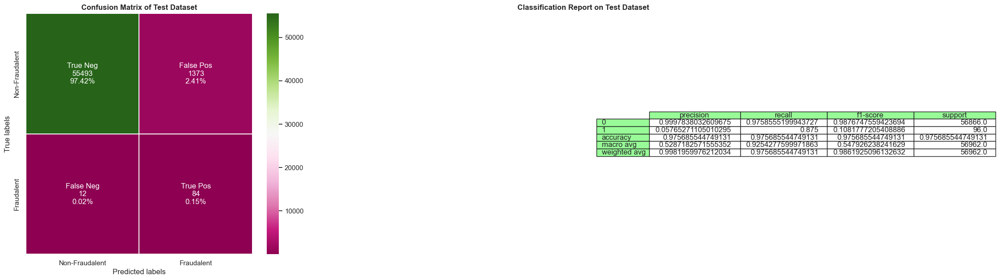

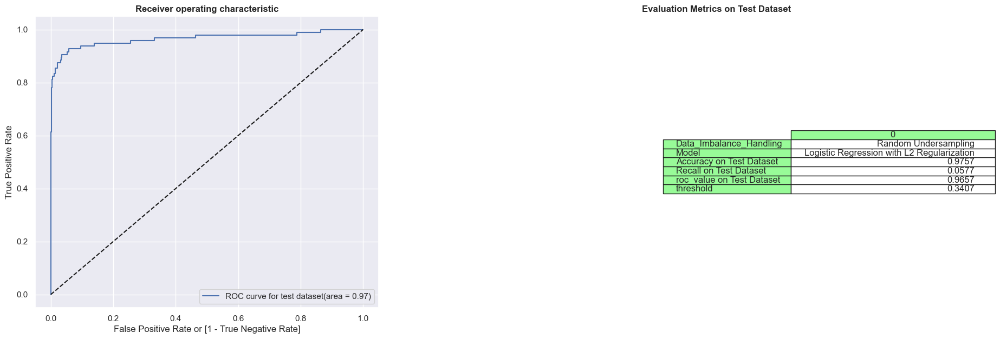

Time Taken by Logistic Regression/L2 RegModel: --- 2.631638526916504 seconds ---
Parameters for l1 regularisations: 
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0.]]
[0.]


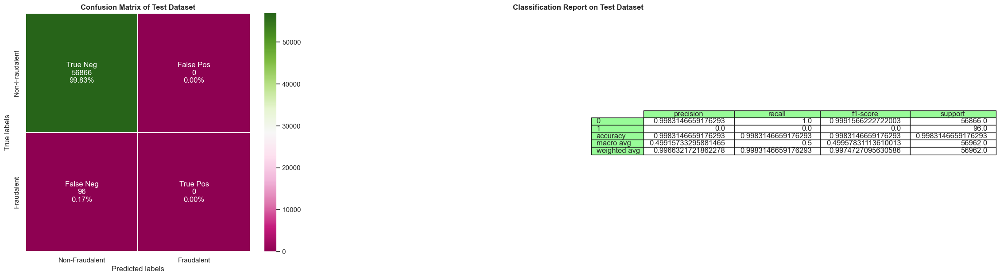

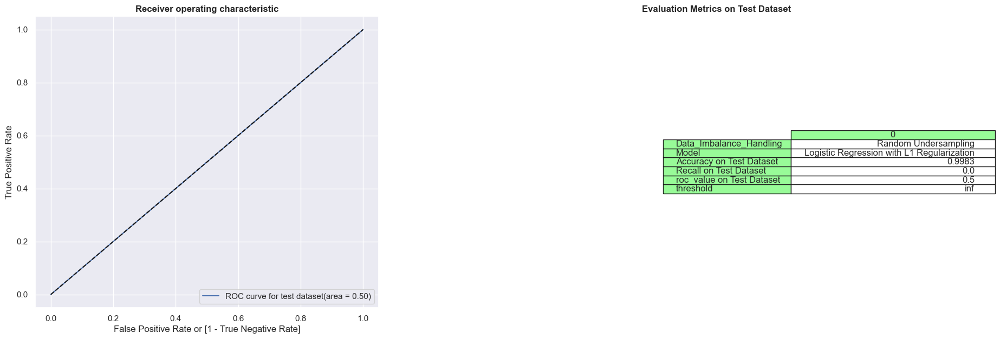

Time Taken by Logistic Regression/L1 RegModel: --- 4.803908586502075 seconds ---


In [84]:
print("Logistic Regression with L1 And L2 Regularisation")
df_Results = buildAndRunLogisticModels(df_Results,"Random Undersampling", X_Under, y_Under , X_test, y_test)

KNN Model


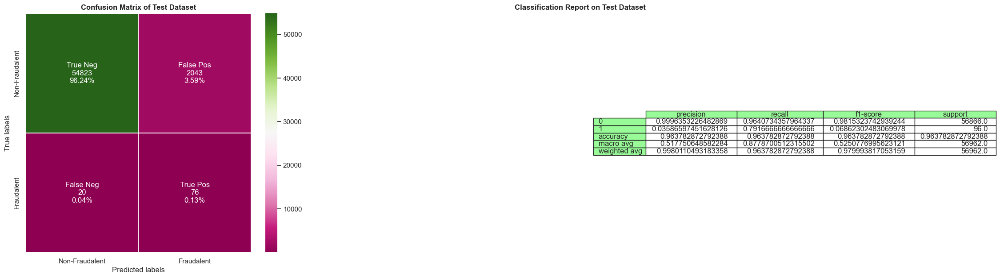

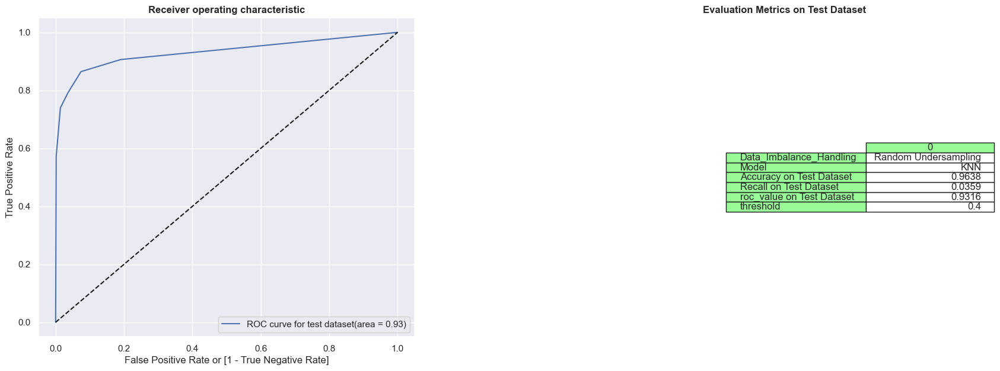

Time Taken by KNN Model: --- 4.301878452301025 seconds ---


In [85]:
# Run KNN Model
print("KNN Model")
df_Results = buildAndRunKNNModels(df_Results,"Random Undersampling",X_Under, y_Under , X_test, y_test)

Decision Tree Models with  'gini' & 'entropy' criteria


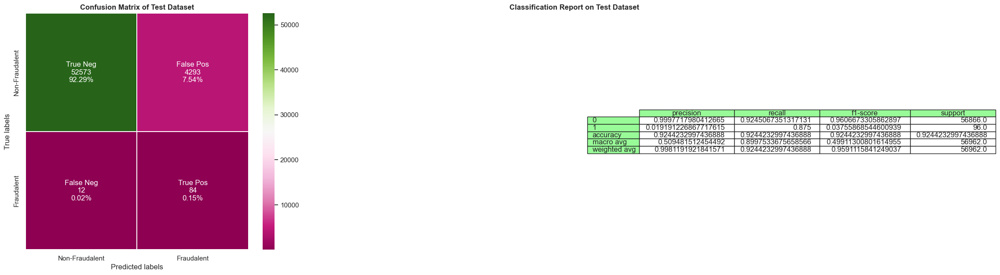

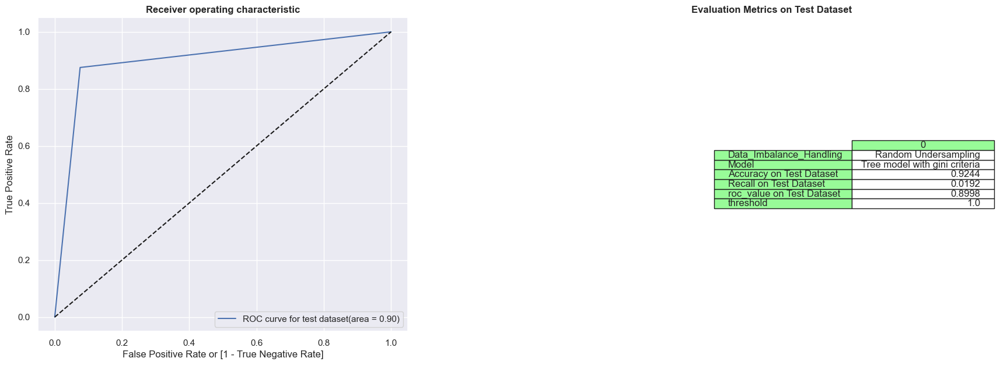

Time Taken by Tree Model with gini criteria: --- 1.710463523864746 seconds ---


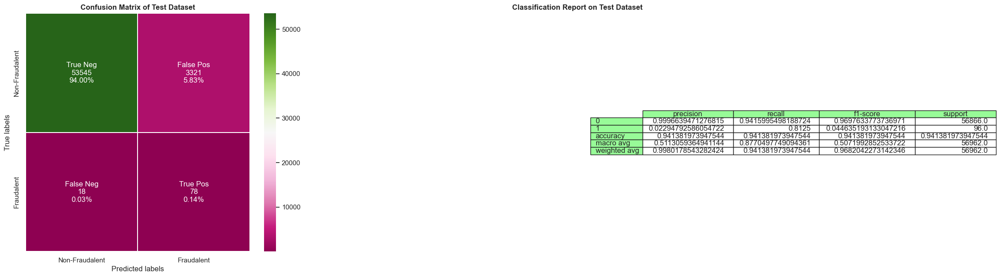

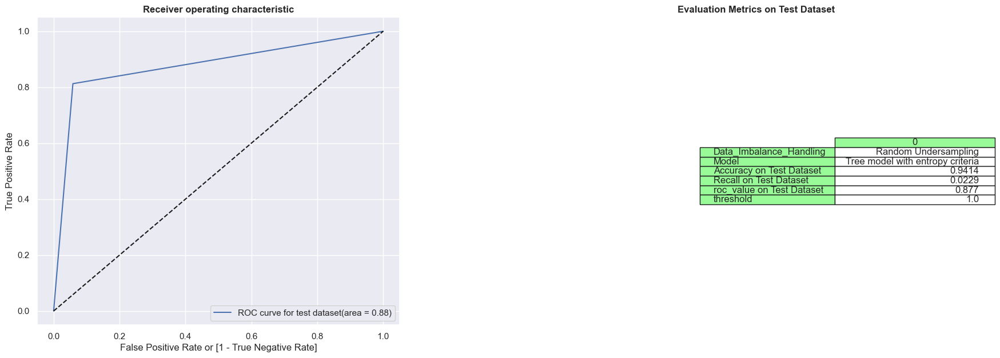

Time Taken by Tree Model with entropy criteria: --- 1.6742815971374512 seconds ---


In [86]:
# Run Decision Tree Models with  'gini' & 'entropy' criteria
print("Decision Tree Models with  'gini' & 'entropy' criteria")
df_Results = buildAndRunTreeModels(df_Results, "Random Undersampling",X_Under, y_Under , X_test, y_test)

Random Forest Model


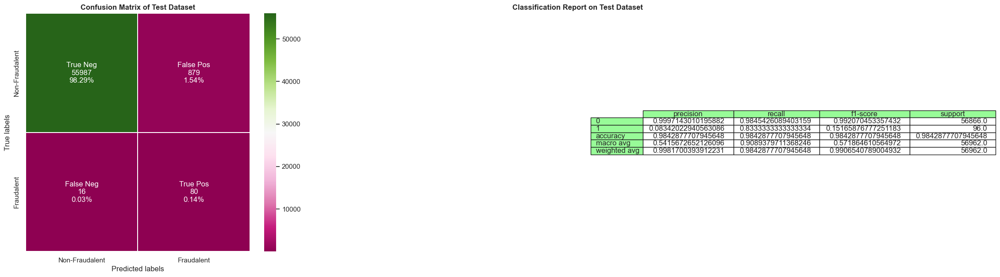

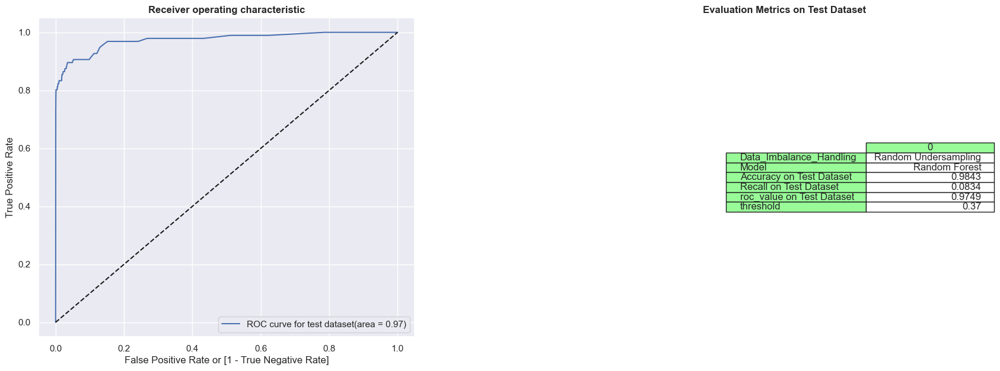

Time Taken by Random Forest Model: --- 6.256913661956787 seconds ---


In [87]:
# Run Random Forest Model
print("Random Forest Model")
df_Results = buildAndRunRandomForestModels(df_Results, "Random Undersampling",X_Under, y_Under , X_test, y_test)

XGBoost Model


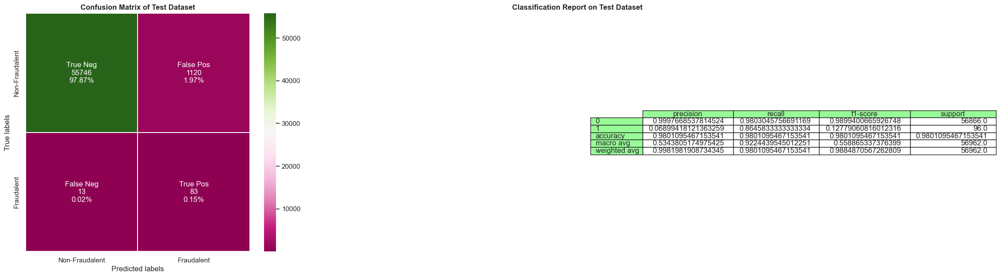

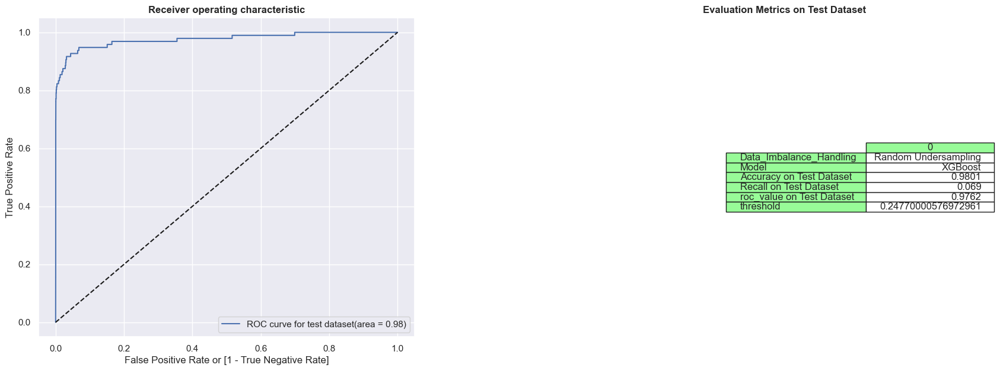

Time Taken by XGBoost Model: --- 1.7699756622314453 seconds ---


In [88]:
# Run XGBoost Model
print("XGBoost Model")
df_Results = buildAndRunXGBoostModels(df_Results, "Random Undersampling",X_Under, y_Under , X_test, y_test)

SVM Model with Sigmoid Kernel


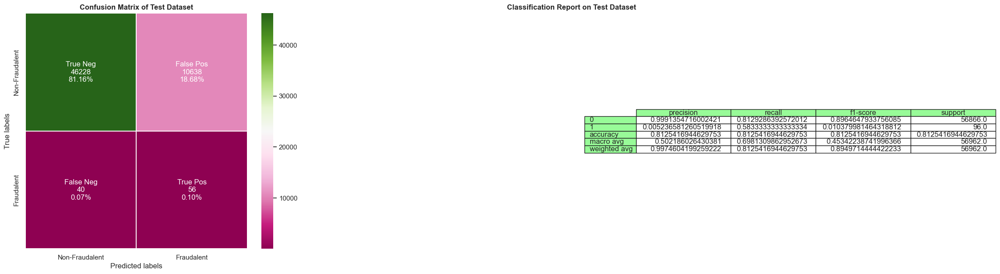

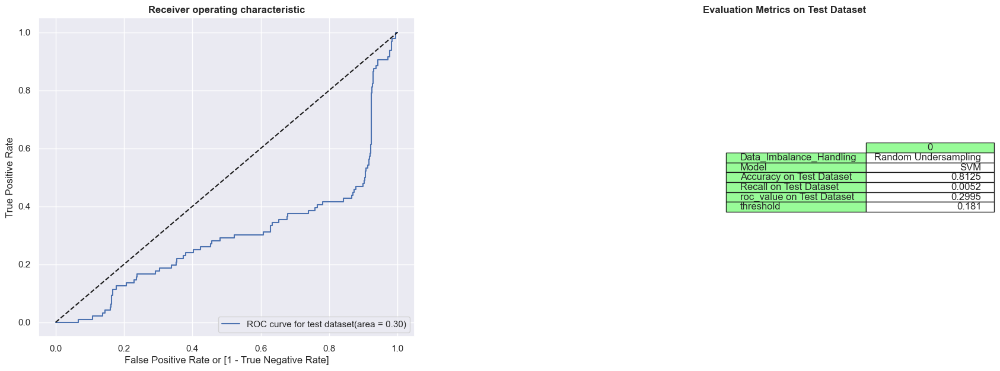

Time Taken by SVM Model: --- 5.631884574890137 seconds ---


In [89]:
#Run SVM Model with Sigmoid Kernel
print("SVM Model with Sigmoid Kernel")
df_Results = buildAndRunSVMModels(df_Results, "Random Undersampling",X_Under, y_Under , X_test, y_test)

In [90]:
df_Results

,Model,Data_Imbalance_Handling,Accuracy on Test Dataset,Recall on Test Dataset,roc_value on Test Dataset,threshold
0,Logistic Regression with L2 Regularization,Power Transformer,0.9990,0.7826,0.9668,0.0013
0,Logistic Regression with L1 Regularization,Power Transformer,0.9988,0.7344,0.9639,0.0093
0,KNN,Power Transformer,0.9993,0.8415,0.9009,0.2000
0,Tree model with gini criteria,Power Transformer,0.9988,0.6273,0.8590,1.0000
0,Tree model with entropy criteria,Power Transformer,0.9991,0.7143,0.8643,1.0000
0,Random Forest,Power Transformer,0.9994,0.8831,0.9406,0.0100
0,XGBoost,Power Transformer,0.9994,0.8961,0.9776,0.0000
0,SVM,Power Transformer,0.9986,0.5686,0.8913,0.0009
0,Logistic Regression with L2 Regularization,StratifiedKFold Cross Validation,0.9988,0.9667,0.9834,0.0015
0,Logistic Regression with L1 Regularization,StratifiedKFold Cross Validation,0.9988,0.9355,0.8891,0.0211


#### Once we have train and test dataset we will feed the data to below models:

1. Logistic Regression with L2 Regularisation
2. Logistic Regression with L1 Regularisation
3. KNN
4. Decision tree model with Gini criteria
5. Decision tree model with Entropy criteria
6. Random Forest
7. XGBoost
8. SVM Model

In [91]:
skf = StratifiedKFold(n_splits=5, random_state=None)
for fold, (train_index, test_index) in enumerate(skf.split(X,y), 1):
    X_train = X.loc[train_index]
    y_train = y.loc[train_index] 
    X_test = X.loc[test_index]
    y_test = y.loc[test_index]  
    ROS = RandomOverSampler(sampling_strategy=0.5)
    X_over, y_over= ROS.fit_resample(X_train, y_train)
X_over = pd.DataFrame(data=X_over,columns=cols) # Create Dataframe for X_over

Logistic Regression with L1 And L2 Regularisation
Parameters for L2 regularisations: 
[[ 3.82589072e-01  4.01047302e-01  2.79433467e-01  8.29515792e-01
   3.61521782e-01 -4.91266892e-01 -3.64984427e-01 -3.32593285e-01
  -2.24579391e-01 -6.54937109e-01  3.04085864e-01 -9.11054965e-01
  -3.07725499e-01 -9.09639164e-01  4.97313349e-05 -5.25707339e-01
  -3.03545920e-01 -1.30658726e-01  1.46439609e-01 -7.23162768e-01
   6.67385975e-02  5.48252942e-01  1.42202688e-01 -4.34814233e-01
   2.12492018e-01 -7.43355716e-02 -3.21935768e-01  1.86325409e-01
   5.71708574e-03  3.98059198e-02]]
[-5.13362083]


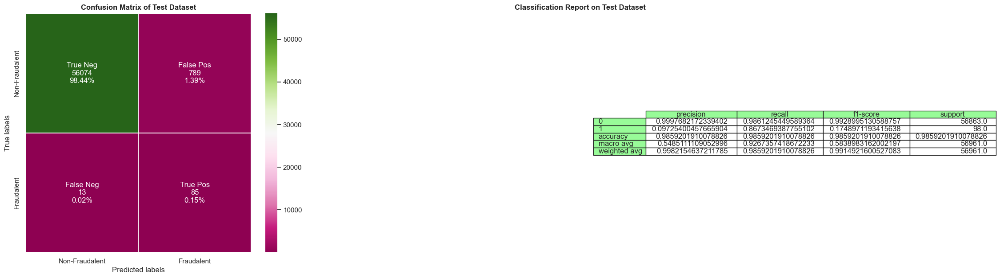

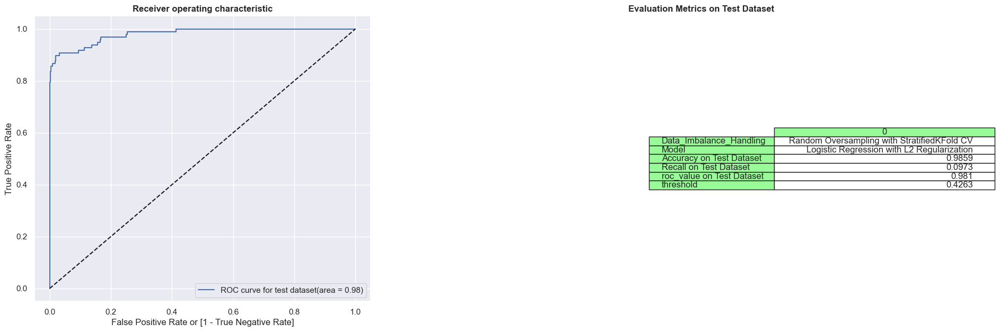

Time Taken by Logistic Regression/L2 RegModel: --- 283.9568305015564 seconds ---
Parameters for l1 regularisations: 
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0.]]
[0.]


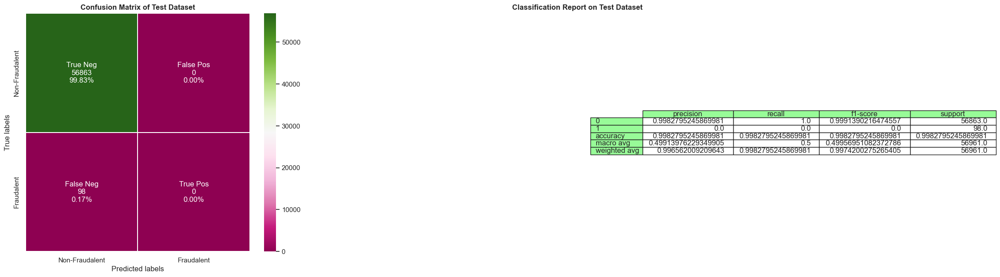

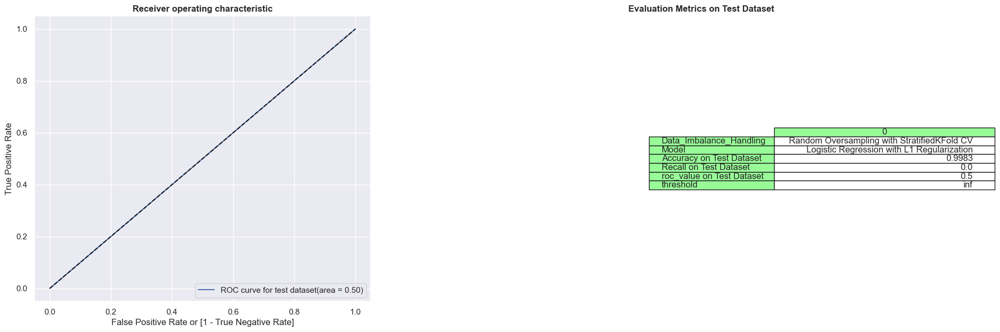

Time Taken by Logistic Regression/L1 RegModel: --- 364.23081040382385 seconds ---


In [92]:
Data_Imbalance_Handling = "Random Oversampling with StratifiedKFold CV"
#Run Logistic Regression with L1 And L2 Regularisation
print("Logistic Regression with L1 And L2 Regularisation")
df_Results = buildAndRunLogisticModels(df_Results , Data_Imbalance_Handling , X_over, y_over, X_test, y_test)

KNN Model


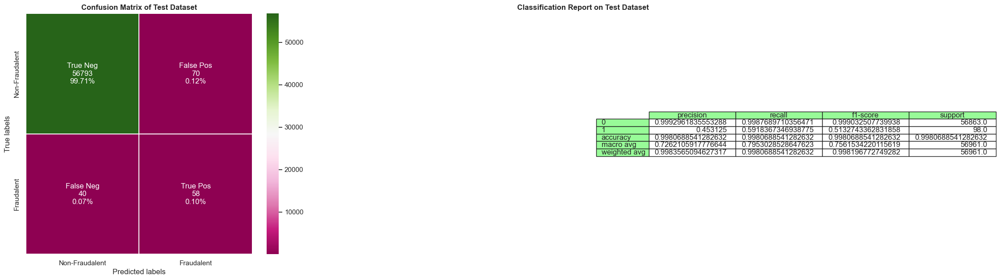

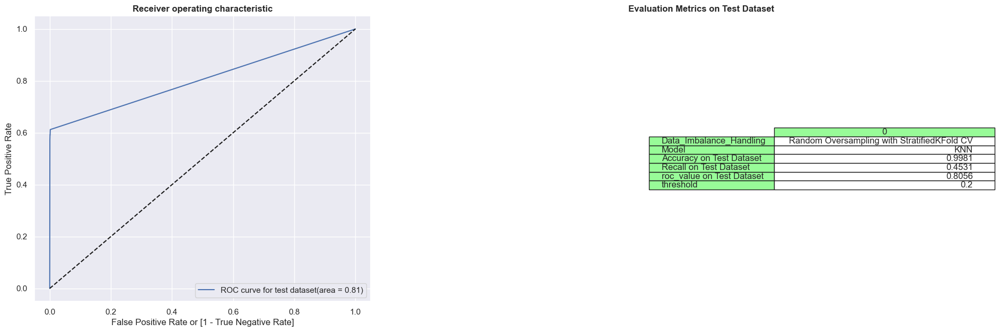

Time Taken by KNN Model: --- 179.65591049194336 seconds ---


In [93]:
#Run KNN Model
print("KNN Model")
df_Results = buildAndRunKNNModels(df_Results , Data_Imbalance_Handling,X_over, y_over, X_test, y_test)

Decision Tree Models with 'gini' & 'entropy' criteria


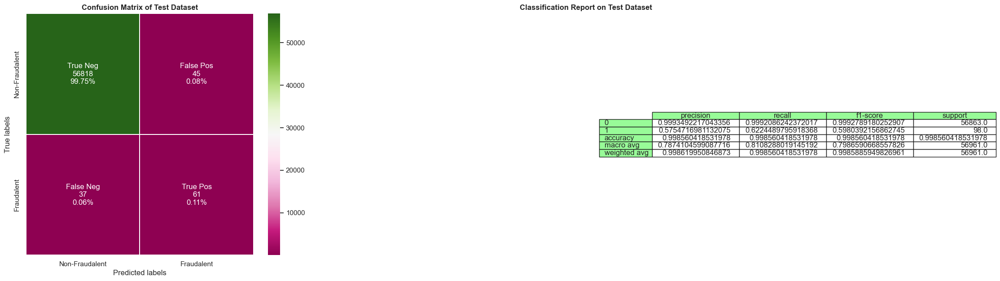

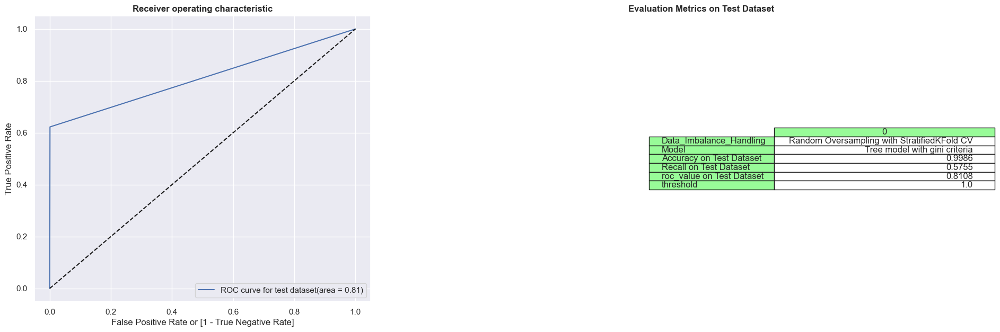

Time Taken by Tree Model with gini criteria: --- 25.570260286331177 seconds ---


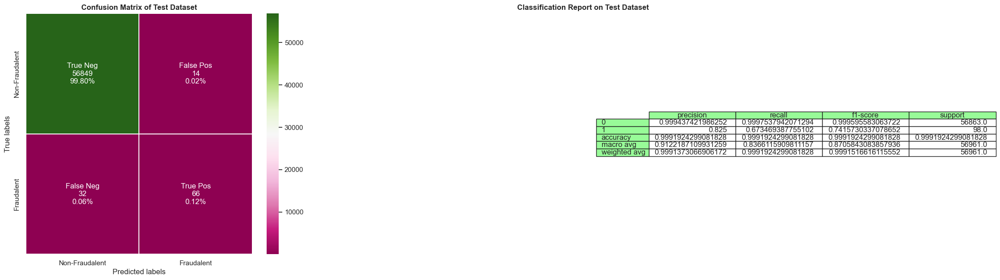

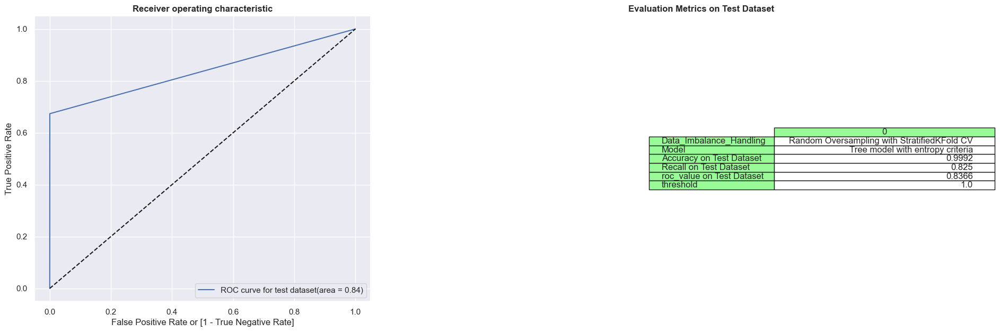

Time Taken by Tree Model with entropy criteria: --- 22.938153982162476 seconds ---


In [94]:
#Run Decision Tree Models with  'gini' & 'entropy' criteria
print("Decision Tree Models with 'gini' & 'entropy' criteria")
df_Results = buildAndRunTreeModels(df_Results , Data_Imbalance_Handling,X_over, y_over, X_test, y_test)

Random Forest Model


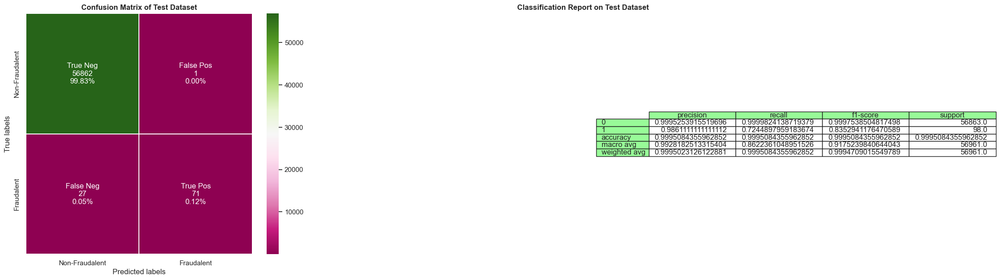

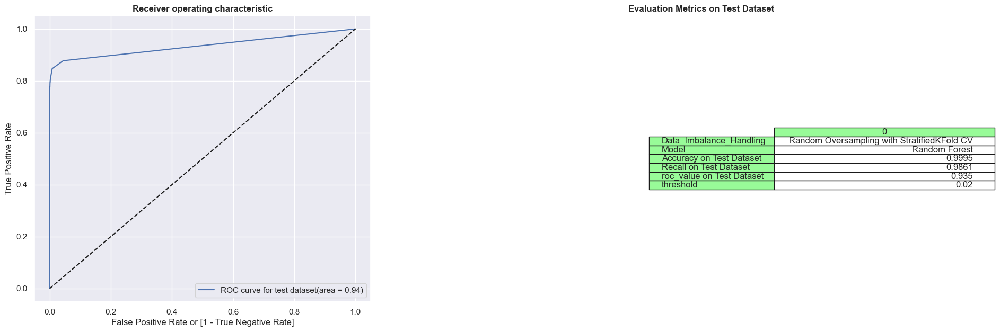

Time Taken by Random Forest Model: --- 2355.9444653987885 seconds ---


In [95]:
#Run Random Forest Model
print("Random Forest Model")
df_Results = buildAndRunRandomForestModels(df_Results , Data_Imbalance_Handling,X_over, y_over, X_test, y_test)

XGBoost Model


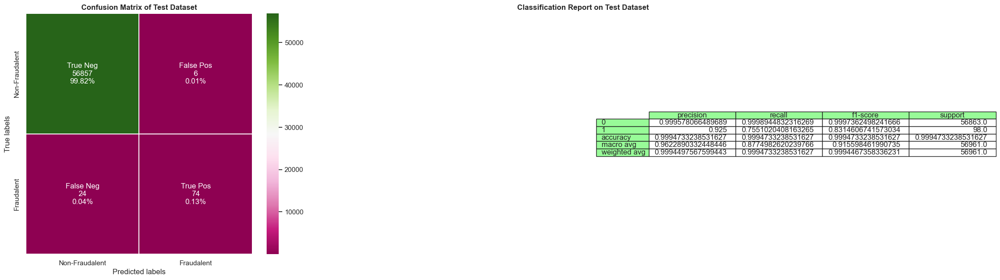

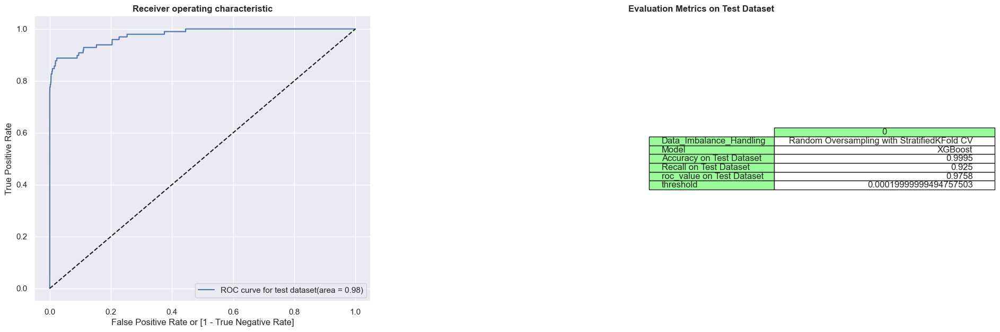

Time Taken by XGBoost Model: --- 5.247253656387329 seconds ---


In [96]:
#Run XGBoost Model
print("XGBoost Model")
df_Results = buildAndRunXGBoostModels(df_Results , Data_Imbalance_Handling,X_over, y_over, X_test, y_test)

In [97]:
df_Results

,Model,Data_Imbalance_Handling,Accuracy on Test Dataset,Recall on Test Dataset,roc_value on Test Dataset,threshold
0,Logistic Regression with L2 Regularization,Power Transformer,0.9990,0.7826,0.9668,0.0013
0,Logistic Regression with L1 Regularization,Power Transformer,0.9988,0.7344,0.9639,0.0093
0,KNN,Power Transformer,0.9993,0.8415,0.9009,0.2000
0,Tree model with gini criteria,Power Transformer,0.9988,0.6273,0.8590,1.0000
0,Tree model with entropy criteria,Power Transformer,0.9991,0.7143,0.8643,1.0000
0,Random Forest,Power Transformer,0.9994,0.8831,0.9406,0.0100
0,XGBoost,Power Transformer,0.9994,0.8961,0.9776,0.0000
0,SVM,Power Transformer,0.9986,0.5686,0.8913,0.0009
0,Logistic Regression with L2 Regularization,StratifiedKFold Cross Validation,0.9988,0.9667,0.9834,0.0015
0,Logistic Regression with L1 Regularization,StratifiedKFold Cross Validation,0.9988,0.9355,0.8891,0.0211


#### Once we have train and test dataset we will feed the data to below models:

1. Logistic Regression with L2 Regularisation
2. Logistic Regression with L1 Regularisation
3. KNN
4. Decision tree model with Gini criteria
5. Decision tree model with Entropy criteria
6. Random Forest
7. XGBoost
8. SVM Model

### Print the class distribution after applying SMOTE

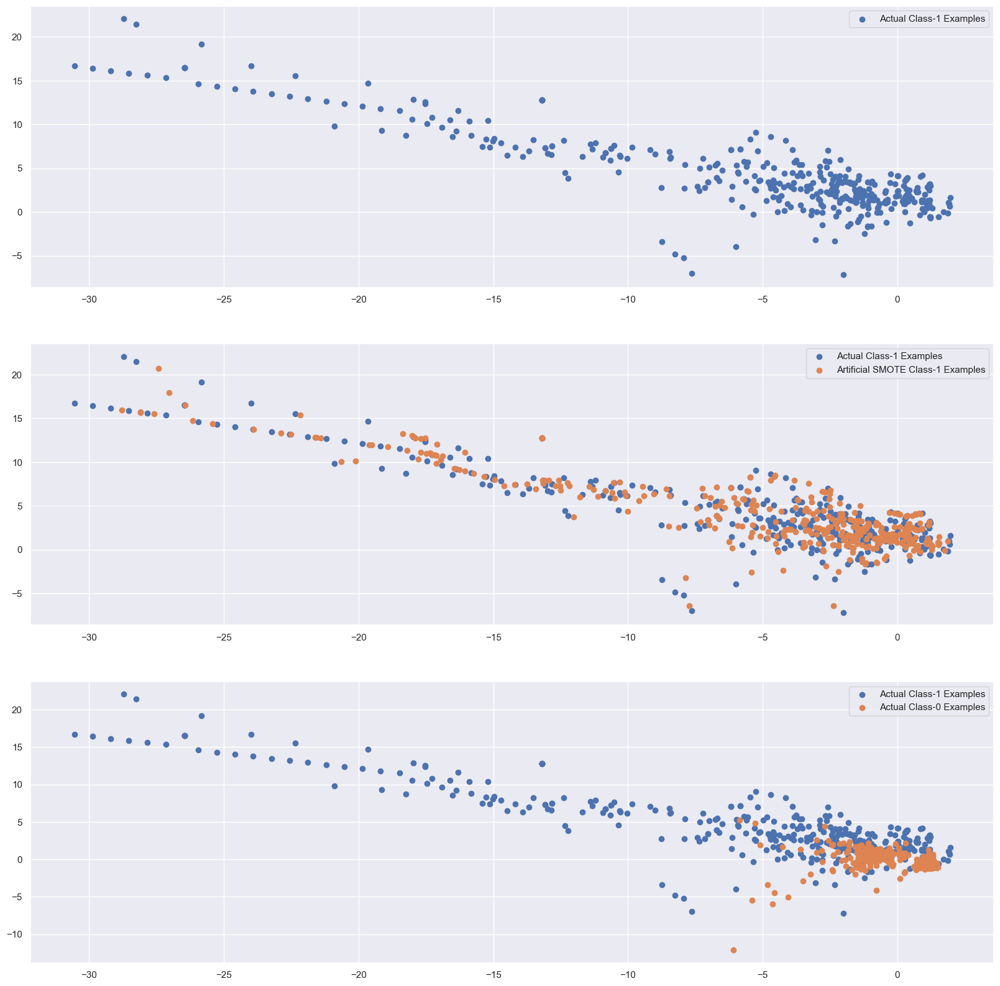

In [98]:
SMOTE_over = SMOTE(random_state=0)
X_train_Smote, y_train_Smote= SMOTE_over.fit_resample(X_train, y_train) 
#Create dataframe
#X_train_Smote = pd.DataFrame(data=X_train_Smote,   columns=cols)
# Artificial minority samples and corresponding minority labels from SMOTE are appended
# below X_train and y_train respectively
# So to exclusively get the artificial minority samples from SMOTE, we do
X_train_smote_1 = X_train_Smote[X_train.shape[0]:]
X_train_1 = X_train.to_numpy()[np.where(y_train==1.0)]
X_train_0 = X_train.to_numpy()[np.where(y_train==0.0)]
plt.rcParams['figure.figsize'] = [20, 20]
fig = plt.figure()
plt.subplot(3, 1, 1)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
plt.legend()
plt.subplot(3, 1, 2)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
n = X_train_1.shape[0]
plt.scatter(X_train_smote_1.iloc[:n, 0], X_train_smote_1.iloc[:n, 1], label='Artificial SMOTE Class-1 Examples')
plt.legend()
plt.subplot(3, 1, 3)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
plt.scatter(X_train_0[:n, 0], X_train_0[:n, 1], label='Actual Class-0 Examples')
plt.legend()
#Create dataframe
X_train_Smote = pd.DataFrame(data=X_train_Smote,   columns=cols)

In [99]:
skf = StratifiedKFold(n_splits=5, random_state=None)
for fold, (train_index, test_index) in enumerate(skf.split(X,y), 1):
    X_train = X.loc[train_index]
    y_train = y.loc[train_index] 
    X_test = X.loc[test_index]
    y_test = y.loc[test_index]  
    SMOTE_skf = SMOTE(random_state=0)
    X_train_Smote, y_train_Smote= SMOTE_skf.fit_resample(X_train, y_train)
X_train_Smote = pd.DataFrame(data=X_train_Smote, columns=cols)

Logistic Regression with L1 And L2 Regularisation
Parameters for L2 regularisations: 
[[ 0.77284572  0.70968111  0.68882214  0.93840461  0.49717238 -0.93750421
  -0.69711428 -0.50703252 -0.4232828  -0.9204835   0.61731192 -1.25035982
  -0.23829141 -1.52842022  0.12548348 -0.7825391  -0.84410716 -0.43431545
   0.22154724 -1.08351183 -0.02398488  0.56487589  0.40550977 -0.91710634
   0.50587358  0.03373804 -0.18223688  0.84841155  0.00903961  0.01100821]]
[-5.30045664]


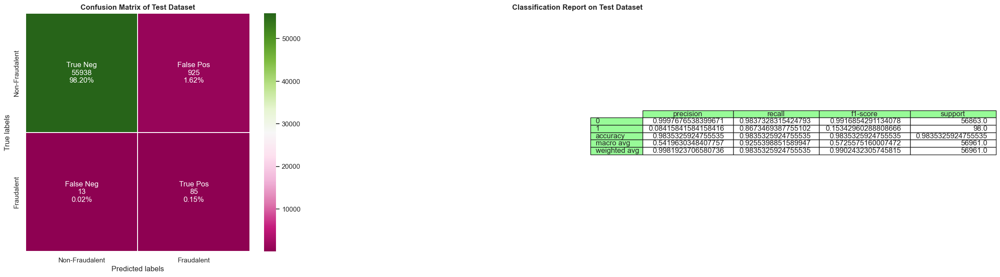

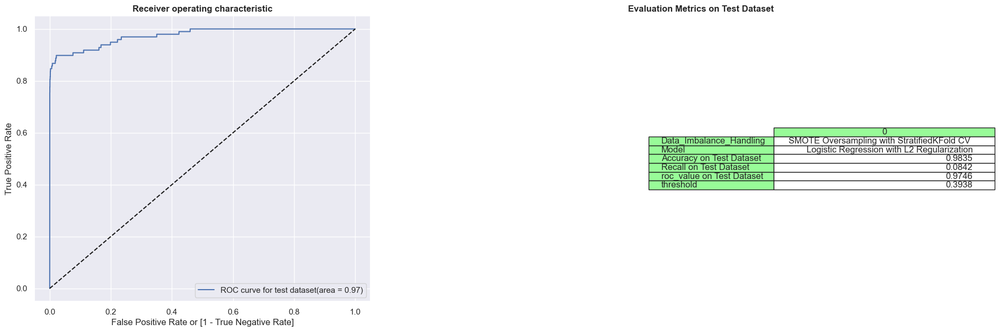

Time Taken by Logistic Regression/L2 RegModel: --- 292.8979482650757 seconds ---
Parameters for l1 regularisations: 
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0.]]
[0.]


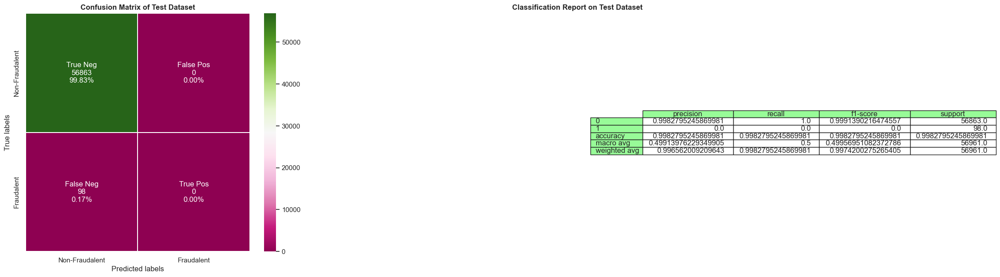

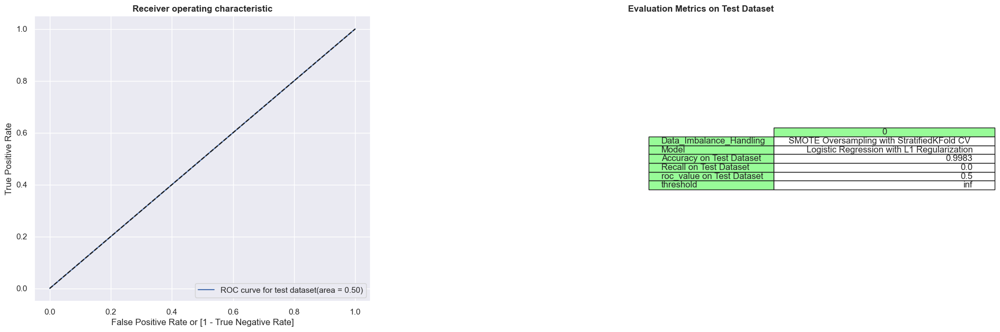

Time Taken by Logistic Regression/L1 RegModel: --- 9813.44099855423 seconds ---


In [100]:
Data_Imbalance_Handling = "SMOTE Oversampling with StratifiedKFold CV "
#Run Logistic Regression with L1 And L2 Regularisation
print("Logistic Regression with L1 And L2 Regularisation")
df_Results = buildAndRunLogisticModels(df_Results, Data_Imbalance_Handling, X_train_Smote, y_train_Smote , X_test, y_test)

Decision Tree Models with  'gini' & 'entropy' criteria


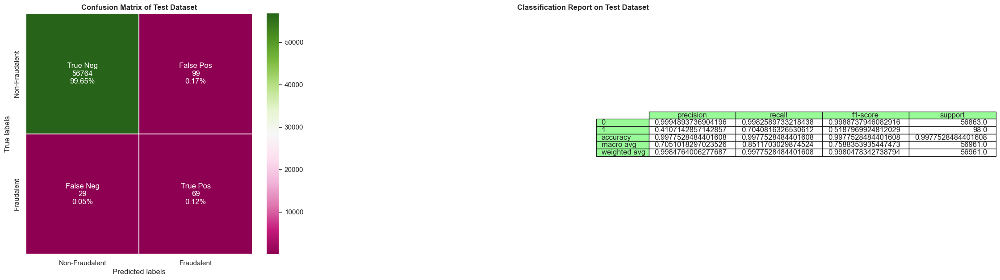

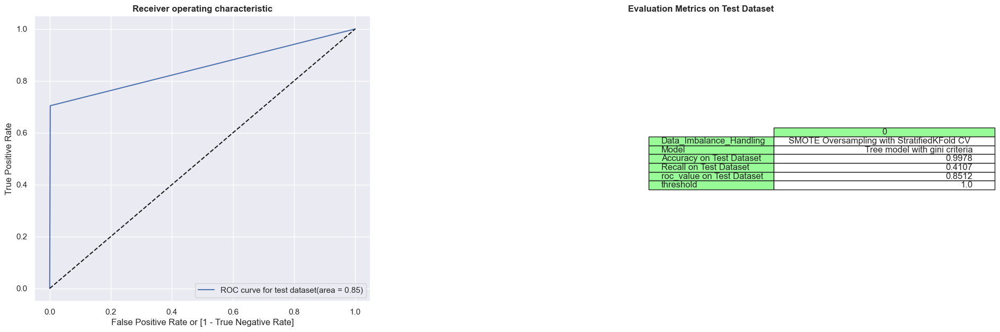

Time Taken by Tree Model with gini criteria: --- 204.34058499336243 seconds ---


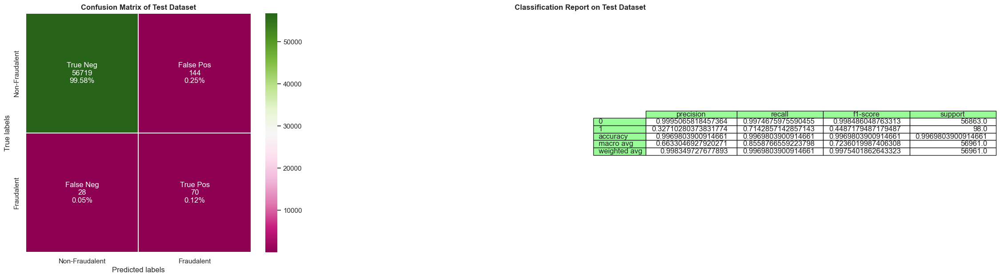

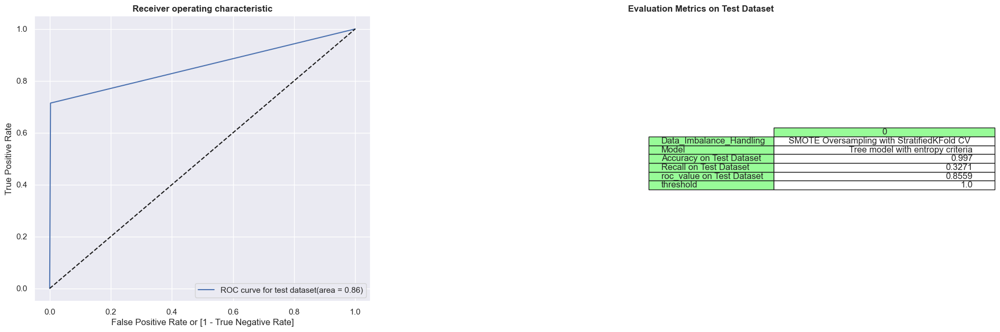

Time Taken by Tree Model with entropy criteria: --- 136.1998107433319 seconds ---


In [102]:
#Run Decision Tree Models with  'gini' & 'entropy' criteria
print("Decision Tree Models with  'gini' & 'entropy' criteria")
df_Results = buildAndRunTreeModels(df_Results, Data_Imbalance_Handling, X_train_Smote, y_train_Smote , X_test, y_test)

Random Forest Model


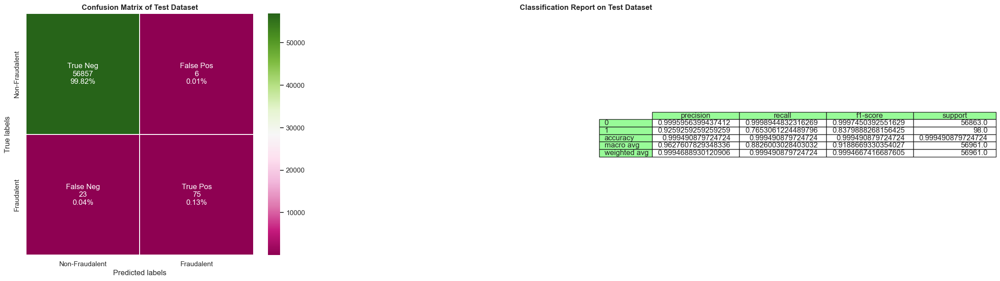

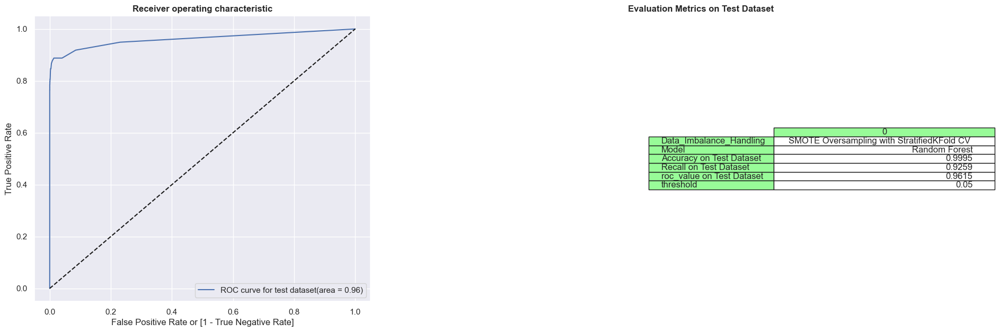

Time Taken by Random Forest Model: --- 2029.723640680313 seconds ---


In [103]:
#Run Random Forest Model
print("Random Forest Model")
df_Results = buildAndRunRandomForestModels(df_Results, Data_Imbalance_Handling, X_train_Smote, y_train_Smote , X_test, y_test)

XGBoost Model


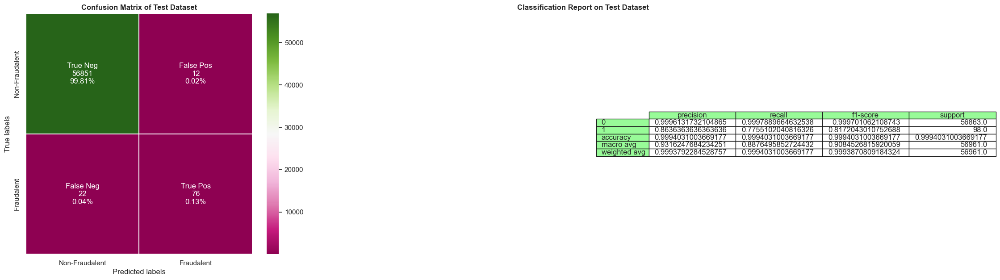

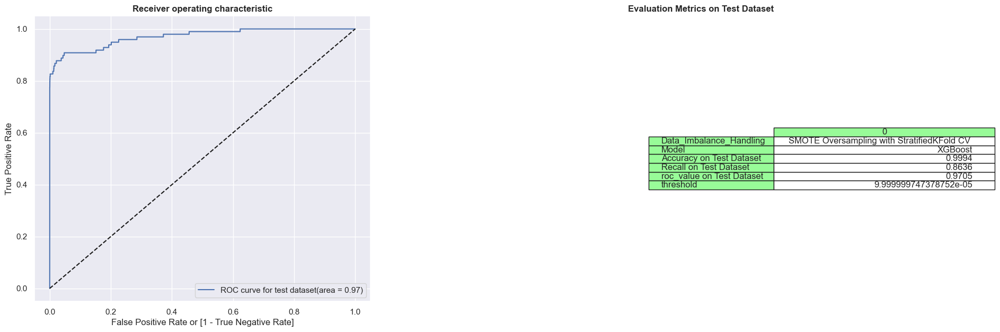

Time Taken by XGBoost Model: --- 17.365870714187622 seconds ---


In [104]:
#Run XGBoost Model
print("XGBoost Model")
df_Results = buildAndRunXGBoostModels(df_Results, Data_Imbalance_Handling, X_train_Smote, y_train_Smote , X_test, y_test)

In [105]:
df_Results

,Model,Data_Imbalance_Handling,Accuracy on Test Dataset,Recall on Test Dataset,roc_value on Test Dataset,threshold
0,Logistic Regression with L2 Regularization,Power Transformer,0.9990,0.7826,0.9668,0.0013
0,Logistic Regression with L1 Regularization,Power Transformer,0.9988,0.7344,0.9639,0.0093
0,KNN,Power Transformer,0.9993,0.8415,0.9009,0.2000
0,Tree model with gini criteria,Power Transformer,0.9988,0.6273,0.8590,1.0000
0,Tree model with entropy criteria,Power Transformer,0.9991,0.7143,0.8643,1.0000
0,Random Forest,Power Transformer,0.9994,0.8831,0.9406,0.0100
0,XGBoost,Power Transformer,0.9994,0.8961,0.9776,0.0000
0,SVM,Power Transformer,0.9986,0.5686,0.8913,0.0009
0,Logistic Regression with L2 Regularization,StratifiedKFold Cross Validation,0.9988,0.9667,0.9834,0.0015
0,Logistic Regression with L1 Regularization,StratifiedKFold Cross Validation,0.9988,0.9355,0.8891,0.0211


In [106]:
df_Results.sort_values(['roc_value on Test Dataset', 'Recall on Test Dataset'], ascending=[False, False])

,Model,Data_Imbalance_Handling,Accuracy on Test Dataset,Recall on Test Dataset,roc_value on Test Dataset,threshold
0,Logistic Regression with L2 Regularization,StratifiedKFold Cross Validation,0.9988,0.9667,0.9834,0.0015
0,Logistic Regression with L2 Regularization,Random Oversampling with StratifiedKFold CV,0.9859,0.0973,0.9810,0.4263
0,XGBoost,Power Transformer,0.9994,0.8961,0.9776,0.0000
0,XGBoost,Random Undersampling,0.9801,0.0690,0.9762,0.2477
0,XGBoost,Random Oversampling with StratifiedKFold CV,0.9995,0.9250,0.9758,0.0002
0,Random Forest,Random Undersampling,0.9843,0.0834,0.9749,0.3700
0,Logistic Regression with L2 Regularization,SMOTE Oversampling with StratifiedKFold CV,0.9835,0.0842,0.9746,0.3938
0,XGBoost,StratifiedKFold Cross Validation,0.9994,0.9583,0.9722,0.0000
0,XGBoost,SMOTE Oversampling with StratifiedKFold CV,0.9994,0.8636,0.9705,0.0001
0,Logistic Regression with L2 Regularization,Power Transformer,0.9990,0.7826,0.9668,0.0013


Conclusion

We have built many models like logistic regression with L1/L2 regularization, SVM, KNN, Decision Tree, Random forest based on the transaction data provided to us.

The data provided to us was an imbalanced data set.

Hence, for building a proper logistic model on top of that we have used some balancing techniques like (Random oversampling, SMOTE, ADASYN etc) to balance the data and applied some of very popular logistic regression models like Random Forest, Logistic regression and some boosting techniques like XGBoost to catch any fraud transactions.

In this imbalanced scenario, Accuracy was not a good evaluation criteria and hence we focussed more on Recall and AUC.
Finally we were able to build a proper model and predicted on test data and the results were satisfying.

We were also able to figure out the variables which will be important in detecting any fraud transactions:V14, V10 and V4 which are the principal components and are not provided for us to maintain confidentiality
PCA components V14, V10 and V4 are the ones which can explain maximum variance in the model and hence has to be focused more